In [1]:
from ema_workbench import load_results
from ema_workbench.analysis import pairs_plotting
import matplotlib.pyplot as plt
from ema_workbench.analysis import feature_scoring
import seaborn as sns
from ema_workbench.analysis import prim
import pandas as pd
from SALib.analyze import sobol
from ema_workbench import Samplers
from ema_workbench.em_framework.salib_samplers import get_SALib_problem
from ema_workbench import Model, RealParameter, ScalarOutcome
from ema_workbench import MultiprocessingEvaluator, ema_logging

from ema_workbench import save_results
import numpy as np
import scipy

# Read in data

In [2]:
BR_LHS_results2222 = load_results('../../results/results_BR_LHS_simplified/results_700_scenarios_BR_noOW_seed2222.gz')
BR_LHS_results3333 = load_results('../../results/results_BR_LHS_simplified/results_700_scenarios_BR_noOW_seed3333.gz')
BR_LHS_results4444 = load_results('../../results/results_BR_LHS_simplified/results_700_scenarios_BR_noOW_seed4444.gz')
BR_LHS_results5555 = load_results('../../results/results_BR_LHS_simplified/results_700_scenarios_BR_noOW_seed5555.gz')
BR_LHS_results6666 = load_results('../../results/results_BR_LHS_simplified/results_700_scenarios_BR_noOW_seed6666.gz')


In [3]:
BR_LHS_experiments2222, BR_LHS_outcomes2222 = BR_LHS_results2222
BR_LHS_experiments3333, BR_LHS_outcomes3333 = BR_LHS_results3333
BR_LHS_experiments4444, BR_LHS_outcomes4444 = BR_LHS_results4444
BR_LHS_experiments5555, BR_LHS_outcomes5555 = BR_LHS_results5555
BR_LHS_experiments6666, BR_LHS_outcomes6666 = BR_LHS_results6666

In [4]:
BR_LHS_experiments2222.keys()

Index(['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA', 'scenario', 'policy',
       'model'],
      dtype='object')

In [5]:
BR_LHS_outcomes2222.keys()

dict_keys(['continuity_mean', 'continuity_vars', 'connectivity_mean', 'connectivity_vars', 'node_frequency_mean', 'node_frequency_var'])

In [6]:
BR_LHS_outcomes2222['continuity_var'] = BR_LHS_outcomes2222['continuity_vars']
BR_LHS_outcomes3333['continuity_var'] = BR_LHS_outcomes3333['continuity_vars']
BR_LHS_outcomes4444['continuity_var'] = BR_LHS_outcomes4444['continuity_vars']
BR_LHS_outcomes5555['continuity_var'] = BR_LHS_outcomes5555['continuity_vars']
BR_LHS_outcomes6666['continuity_var'] = BR_LHS_outcomes6666['continuity_vars']

BR_LHS_outcomes2222['connectivity_var'] = BR_LHS_outcomes2222['connectivity_vars']
BR_LHS_outcomes3333['connectivity_var'] = BR_LHS_outcomes3333['connectivity_vars']
BR_LHS_outcomes4444['connectivity_var'] = BR_LHS_outcomes4444['connectivity_vars']
BR_LHS_outcomes5555['connectivity_var'] = BR_LHS_outcomes5555['connectivity_vars']
BR_LHS_outcomes6666['connectivity_var'] = BR_LHS_outcomes6666['connectivity_vars']

In [7]:
BR_LHS_outcomes2222.pop('continuity_vars')
BR_LHS_outcomes3333.pop('continuity_vars')
BR_LHS_outcomes4444.pop('continuity_vars')
BR_LHS_outcomes5555.pop('continuity_vars')
BR_LHS_outcomes6666.pop('continuity_vars')

BR_LHS_outcomes2222.pop('connectivity_vars')
BR_LHS_outcomes3333.pop('connectivity_vars')
BR_LHS_outcomes4444.pop('connectivity_vars')
BR_LHS_outcomes5555.pop('connectivity_vars')
BR_LHS_outcomes6666.pop('connectivity_vars')

array([1.65815632, 1.68211497, 1.79075334, 1.11487789, 2.63821291,
       2.25348043, 2.07557675, 1.72294496, 2.28368087, 1.84145221,
       2.65749102, 2.19267349, 2.30058549, 1.28764702, 2.31415375,
       2.19189124, 2.51772176, 2.05063608, 2.06493579, 1.14550019,
       2.53807273, 1.25574972, 2.44738191, 2.15056816, 2.20634802,
       2.45925942, 1.95706103, 2.19983524, 2.34721948, 2.39834546,
       1.5854706 , 2.2393259 , 2.25149159, 2.04872937, 1.59975496,
       2.17812371, 2.14581973, 1.80725657, 2.3057212 , 2.11709543,
       0.59251044, 1.33966052, 2.463177  , 1.60284999, 2.13468045,
       2.13277949, 2.36815413, 2.15500399, 1.59245069, 2.14687357,
       2.15893589, 2.0415273 , 2.25732946, 1.86892185, 1.31011893,
       2.33684931, 2.26400653, 2.21245942, 1.79729147, 1.51446865,
       2.20692316, 2.64287219, 1.03913667, 1.79396617, 2.23343295,
       2.0304712 , 1.28306807, 2.21841538, 2.51387691, 1.96437377,
       2.56192014, 1.83388348, 1.96589188, 2.19476408, 2.26943

In [8]:
outcomes_change = BR_LHS_outcomes2222
BR_LHS_outcomes2222 = {}
BR_LHS_outcomes2222["connectivity_mean"] = outcomes_change['connectivity_mean']
BR_LHS_outcomes2222["connectivity_var"] = outcomes_change['connectivity_var']
BR_LHS_outcomes2222["continuity_mean"] = outcomes_change['continuity_mean']
BR_LHS_outcomes2222["continuity_var"] = outcomes_change['continuity_var']
BR_LHS_outcomes2222["node_frequency_mean"] = outcomes_change['node_frequency_mean']
BR_LHS_outcomes2222["node_frequency_var"] = outcomes_change['node_frequency_var']

In [9]:
outcomes_change = BR_LHS_outcomes3333
BR_LHS_outcomes3333 = {}
BR_LHS_outcomes3333["connectivity_mean"] = outcomes_change['connectivity_mean']
BR_LHS_outcomes3333["connectivity_var"] = outcomes_change['connectivity_var']
BR_LHS_outcomes3333["continuity_mean"] = outcomes_change['continuity_mean']
BR_LHS_outcomes3333["continuity_var"] = outcomes_change['continuity_var']
BR_LHS_outcomes3333["node_frequency_mean"] = outcomes_change['node_frequency_mean']
BR_LHS_outcomes3333["node_frequency_var"] = outcomes_change['node_frequency_var']

In [10]:
outcomes_change = BR_LHS_outcomes4444
BR_LHS_outcomes4444 = {}
BR_LHS_outcomes4444["connectivity_mean"] = outcomes_change['connectivity_mean']
BR_LHS_outcomes4444["connectivity_var"] = outcomes_change['connectivity_var']
BR_LHS_outcomes4444["continuity_mean"] = outcomes_change['continuity_mean']
BR_LHS_outcomes4444["continuity_var"] = outcomes_change['continuity_var']
BR_LHS_outcomes4444["node_frequency_mean"] = outcomes_change['node_frequency_mean']
BR_LHS_outcomes4444["node_frequency_var"] = outcomes_change['node_frequency_var']

In [11]:
outcomes_change = BR_LHS_outcomes5555
BR_LHS_outcomes5555 = {}
BR_LHS_outcomes5555["connectivity_mean"] = outcomes_change['connectivity_mean']
BR_LHS_outcomes5555["connectivity_var"] = outcomes_change['connectivity_var']
BR_LHS_outcomes5555["continuity_mean"] = outcomes_change['continuity_mean']
BR_LHS_outcomes5555["continuity_var"] = outcomes_change['continuity_var']
BR_LHS_outcomes5555["node_frequency_mean"] = outcomes_change['node_frequency_mean']
BR_LHS_outcomes5555["node_frequency_var"] = outcomes_change['node_frequency_var']

In [12]:
outcomes_change = BR_LHS_outcomes6666
BR_LHS_outcomes6666 = {}
BR_LHS_outcomes6666["connectivity_mean"] = outcomes_change['connectivity_mean']
BR_LHS_outcomes6666["connectivity_var"] = outcomes_change['connectivity_var']
BR_LHS_outcomes6666["continuity_mean"] = outcomes_change['continuity_mean']
BR_LHS_outcomes6666["continuity_var"] = outcomes_change['continuity_var']
BR_LHS_outcomes6666["node_frequency_mean"] = outcomes_change['node_frequency_mean']
BR_LHS_outcomes6666["node_frequency_var"] = outcomes_change['node_frequency_var']

## Code for making histograms and scatter plots

In [73]:
def make_histogram_full(outcome):
    fig, axs = plt.subplots(3, 2, figsize=(15, 15))
    histogram = pd.Series(outcome.get("continuity_mean"))
    axs[0, 0].hist(histogram, bins=20, rwidth=0.9,
                           color='#607c8e')
    axs[0, 0].set_title("Continuity_mean")
    axs[0, 0].set_xlabel('Value')
    axs[0, 0].set_ylabel('Frequency')

    histogram = pd.Series(outcome.get("continuity_vars"))
    axs[0, 1].hist(histogram, bins=20, rwidth=0.9,
                           color='#607c8e')
    axs[0, 1].set_title("Continuity_vars")
    axs[0, 1].set_xlabel('Value')
    axs[0, 1].set_ylabel('Frequency')

    histogram = pd.Series(outcome.get("connectivity_mean"))
    axs[1, 0].hist(histogram, bins=20, rwidth=0.9,
                           color='#607c8e')
    axs[1, 0].set_title("Connectivity_mean")
    axs[1, 0].set_xlabel('Value')
    axs[1, 0].set_ylabel('Frequency')

    histogram = pd.Series(outcome.get("connectivity_vars"))
    axs[1, 1].hist(histogram, bins=20, rwidth=0.9,
                           color='#607c8e')
    axs[1, 1].set_title("Connectivity_vars")
    axs[1, 1].set_xlabel('Value')
    axs[1, 1].set_ylabel('Frequency')

    histogram = pd.Series(outcome.get("node_frequency_mean"))
    axs[2, 0].hist(histogram, bins=20, rwidth=0.9,
                          color='#607c8e')
    axs[2, 0].set_title("node_frequency_mean")
    axs[2, 0].set_xlabel('Value')
    axs[2, 0].set_ylabel('Frequency')


    histogram = pd.Series(outcome.get("node_frequency_var"))
    axs[2, 1].hist(histogram, bins=20, rwidth=0.9,
                           color='#607c8e')
    axs[2, 1].set_title("node_frequency_vars")
    axs[2, 1].set_xlabel('Value')
    axs[2, 1].set_ylabel('Frequency')

In [28]:
def make_scatterplot_full(uncertainty):
    fig, axs = plt.subplots(3, 2, figsize=(15, 15))
    axs[0, 0].scatter(pd.Series(experiments_combined[uncertainty]), outcomes_combined.get("continuity_mean"))
    axs[0, 0].set_title("continuity_mean")
    axs[0, 0].set_xlabel(uncertainty)
    axs[0, 0].set_ylabel('continuity_mean')
    
    axs[0, 1].scatter(pd.Series(experiments_combined[uncertainty]), outcomes_combined.get("continuity_vars"))
    axs[0, 1].set_title("continuity_vars")
    axs[0, 1].set_xlabel(uncertainty)
    axs[0, 1].set_ylabel('continuity_vars')
    
    axs[1, 0].scatter(pd.Series(experiments_combined[uncertainty]), outcomes_combined.get("connectivity_mean"))
    axs[1, 0].set_title("connectivity_mean")
    axs[1, 0].set_xlabel(uncertainty)
    axs[1, 0].set_ylabel('connectivity_mean')
    
    axs[1, 1].scatter(pd.Series(experiments_combined[uncertainty]), outcomes_combined.get("connectivity_vars"))
    axs[1, 1].set_title("connectivity_vars")
    axs[1, 1].set_xlabel(uncertainty)
    axs[1, 1].set_ylabel('connectivity_vars')
    
    axs[2, 0].scatter(pd.Series(experiments_combined[uncertainty]), outcomes_combined.get("node_frequency_mean"))
    axs[2, 0].set_title("node_frequency_mean")
    axs[2, 0].set_xlabel(uncertainty)
    axs[2, 0].set_ylabel('node_frequency_mean')
    
    axs[2, 1].scatter(pd.Series(experiments_combined[uncertainty]), outcomes_combined.get("node_frequency_mean"))
    axs[2, 1].set_title("node_frequency_mean")
    axs[2, 1].set_xlabel(uncertainty)
    axs[2, 1].set_ylabel('node_frequency_mean')


## Feature importance and plotting values per seed

### Seed 2222

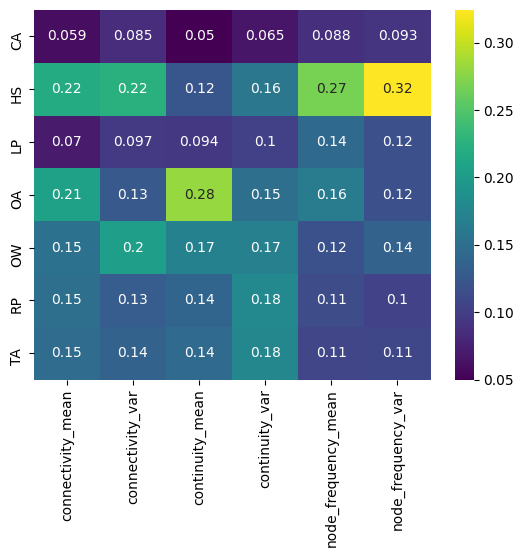

In [13]:
fs = feature_scoring.get_feature_scores_all(BR_LHS_experiments2222[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']], BR_LHS_outcomes2222)
heatmap = sns.heatmap(fs.rename_axis(index=None, columns=None), cmap="viridis", annot=True)
plt.savefig('BR_LHS_ETRF_seed2222.png', bbox_inches='tight')

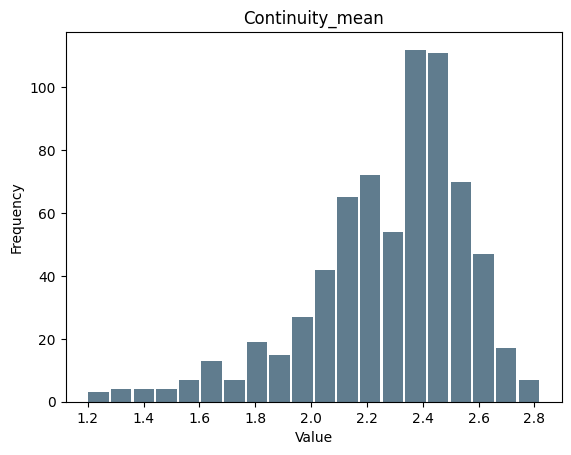

In [13]:
histogram = pd.Series(BR_LHS_outcomes2222.get("continuity_mean"))
fig, ax = plt.subplots()
ax.hist(histogram, bins=20, rwidth=0.9,
                       color='#607c8e')
ax.set_title("Continuity_mean")
ax.set_xlabel('Value')
ax.set_ylabel('Frequency')

plt.savefig('BR_LHS_continuity_mean_hist_seed2222.png', bbox_inches='tight')

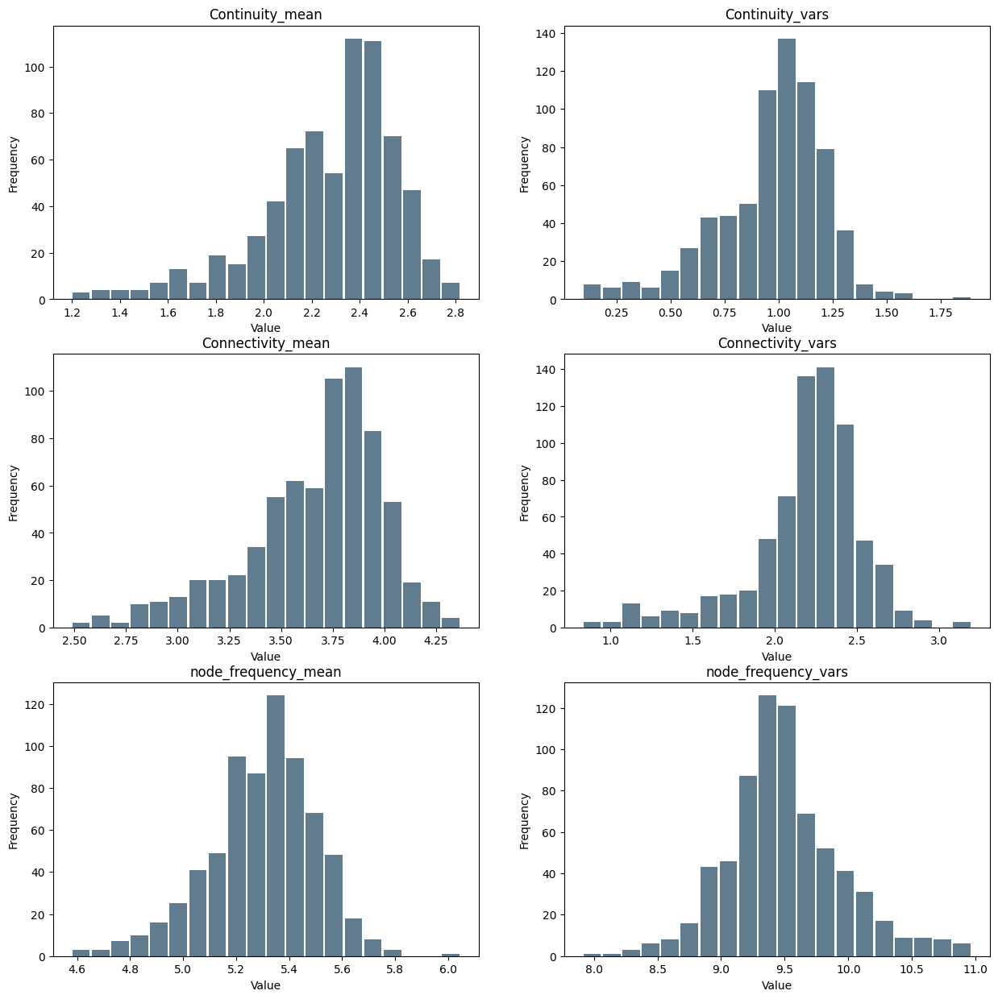

In [57]:
make_histogram_full(BR_LHS_ourtomes2222)

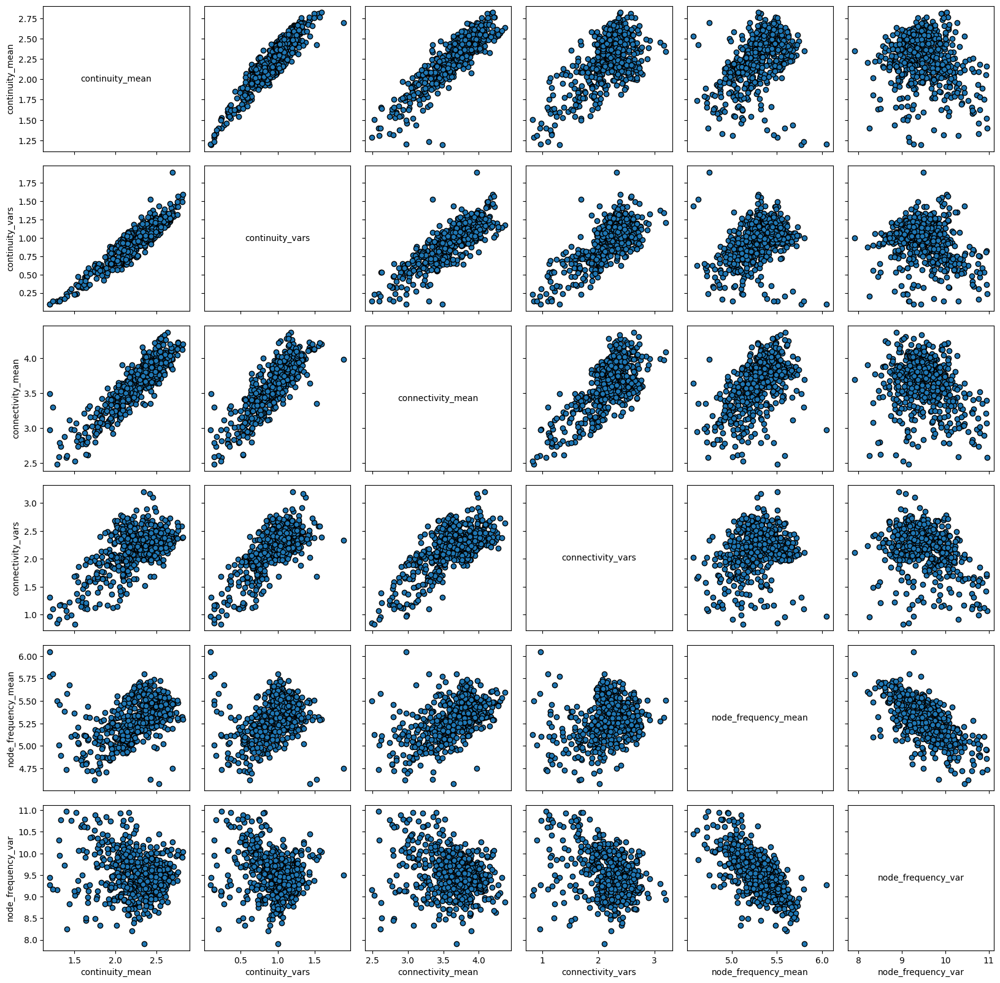

In [62]:
fig, axes = pairs_plotting.pairs_scatter(BR_LHS_experiments2222, BR_LHS_ourtomes2222, legend=True)
fig.set_size_inches(20, 20)
plt.show()

In [44]:
corr_mat = pd.DataFrame(columns=['continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var'])
p_mat = pd.DataFrame()
for value1 in ['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']:
    for value2 in ['continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var']:
        corr_mat.at[value1, value2] = scipy.stats.kendalltau(BR_LHS_experiments2222[value1], pd.DataFrame(BR_LHS_outcomes2222)[value2])[0]
        p_mat.at[value1, value2] = scipy.stats.kendalltau(BR_LHS_experiments2222[value1], pd.DataFrame(BR_LHS_outcomes2222)[value2])[1]
     

In [45]:
corr_mat.astype(float).round(3)

,continuity_mean,continuity_var,connectivity_mean,connectivity_var,node_frequency_mean,node_frequency_var
CA,0.010,0.031,-0.007,0.032,-0.024,0.016
HS,0.207,0.187,0.276,0.231,0.320,-0.318
LP,0.106,0.112,-0.036,-0.042,0.160,-0.055
OA,0.391,0.214,0.295,-0.081,0.220,0.089
OW,0.248,0.235,0.203,0.282,-0.047,0.064
RP,-0.231,-0.285,-0.211,-0.129,-0.103,-0.043
TA,0.267,0.306,0.247,0.150,0.126,-0.077


In [47]:
p_mat.round(3)

,continuity_mean,continuity_var,connectivity_mean,connectivity_var,node_frequency_mean,node_frequency_var
CA,0.691,0.213,0.796,0.200,0.345,0.524
HS,0.000,0.000,0.000,0.000,0.000,0.000
LP,0.000,0.000,0.151,0.093,0.000,0.029
OA,0.000,0.000,0.000,0.001,0.000,0.000
OW,0.000,0.000,0.000,0.000,0.062,0.012
RP,0.000,0.000,0.000,0.000,0.000,0.088
TA,0.000,0.000,0.000,0.000,0.000,0.002


In [46]:
p_mat

,continuity_mean,continuity_var,connectivity_mean,connectivity_var,node_frequency_mean,node_frequency_var
CA,6.910651e-01,2.134959e-01,7.957131e-01,1.995464e-01,3.454950e-01,5.241954e-01
HS,2.309084e-16,1.372021e-13,8.132055e-28,5.243984e-20,1.094109e-36,2.302272e-36
LP,2.738790e-05,8.750673e-06,1.505655e-01,9.265626e-02,2.257681e-10,2.869168e-02
OA,5.139630e-54,2.395736e-17,1.386507e-31,1.357434e-03,2.919360e-18,3.979864e-04
OW,1.101141e-22,1.502000e-20,7.885244e-16,6.528147e-29,6.212988e-02,1.160470e-02
RP,5.436073e-20,1.322295e-29,5.863370e-17,3.551041e-07,4.231013e-05,8.816200e-02
TA,3.770460e-26,9.202646e-34,1.560541e-22,2.647409e-09,5.938949e-07,2.324482e-03


### Seed 3333

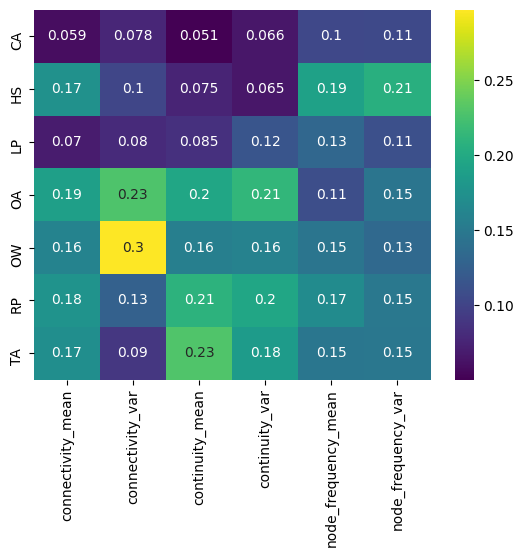

In [14]:
fs = feature_scoring.get_feature_scores_all(BR_LHS_experiments3333[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']], BR_LHS_outcomes3333)
heatmap = sns.heatmap(fs.rename_axis(index=None, columns=None), cmap="viridis", annot=True)
plt.savefig('BR_LHS_ETRF_seed3333.png', bbox_inches='tight')

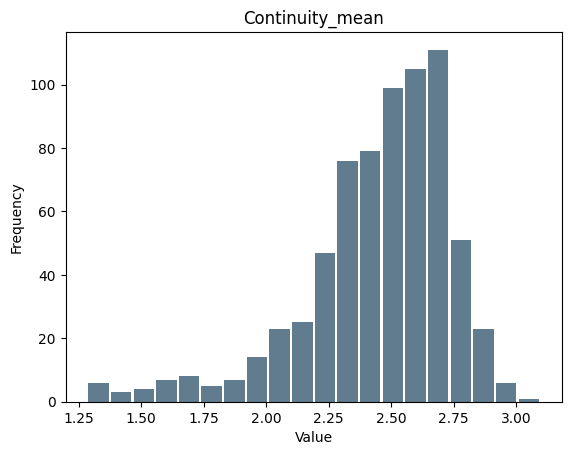

In [16]:
histogram = pd.Series(BR_LHS_outcomes3333.get("continuity_mean"))
fig, ax = plt.subplots()
ax.hist(histogram, bins=20, rwidth=0.9,
                       color='#607c8e')
ax.set_title("Continuity_mean")
ax.set_xlabel('Value')
ax.set_ylabel('Frequency')

plt.savefig('BR_LHS_continuity_mean_hist_seed3333.png', bbox_inches='tight')

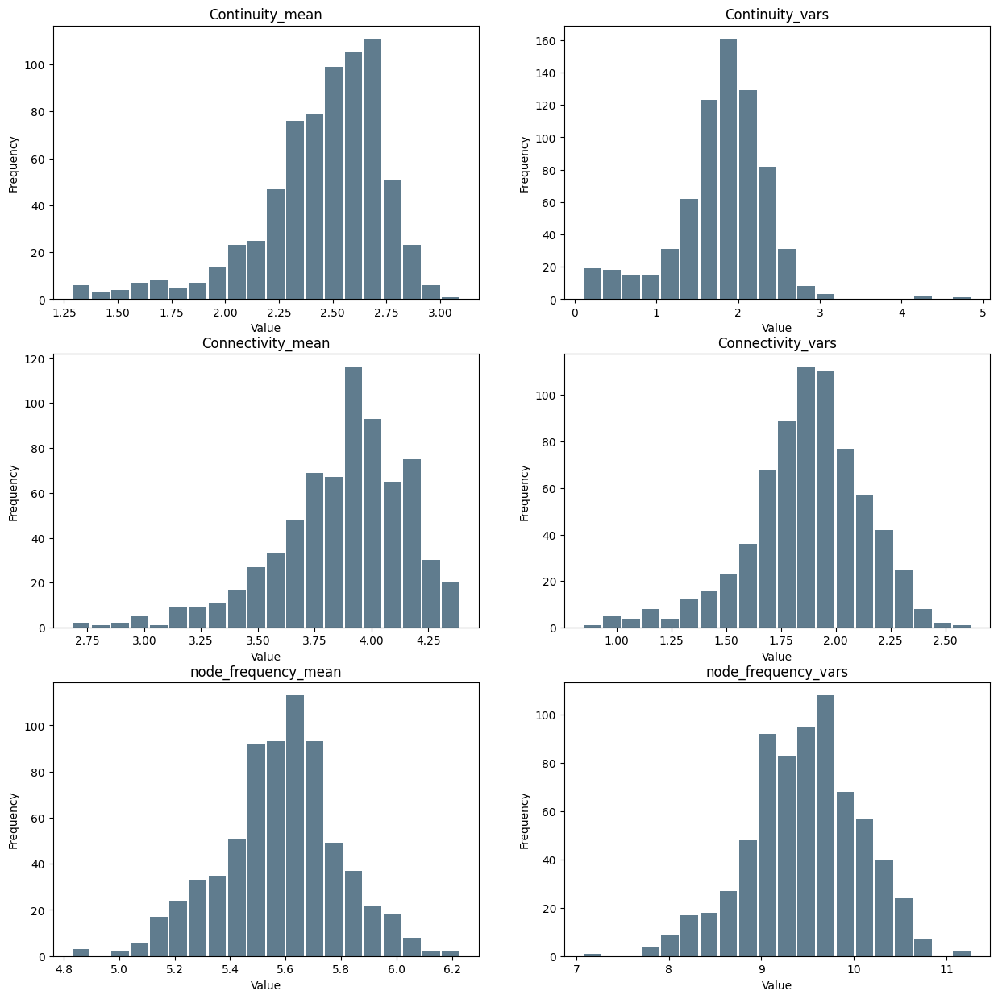

In [58]:
make_histogram_full(BR_LHS_ourtomes3333)

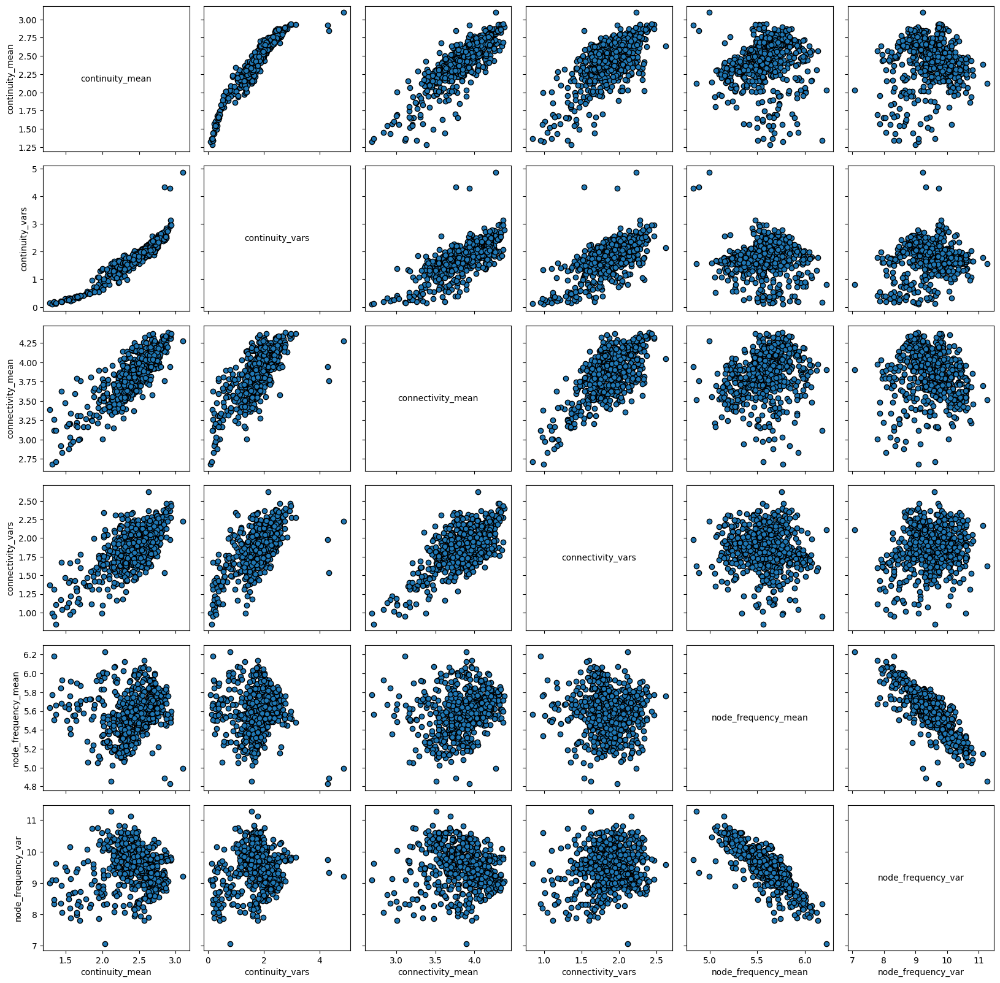

In [63]:
fig, axes = pairs_plotting.pairs_scatter(BR_LHS_experiments3333, BR_LHS_ourtomes3333, legend=True)
fig.set_size_inches(20, 20)
plt.show()

In [41]:
corr_mat = pd.DataFrame(columns=['continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var'])
p_mat = pd.DataFrame()
for value1 in ['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']:
    for value2 in ['continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var']:
        corr_mat.at[value1, value2] = scipy.stats.kendalltau(BR_LHS_experiments3333[value1], pd.DataFrame(BR_LHS_outcomes3333)[value2])[0]
        p_mat.at[value1, value2] = scipy.stats.kendalltau(BR_LHS_experiments3333[value1], pd.DataFrame(BR_LHS_outcomes3333)[value2])[1]
     

In [42]:
corr_mat.astype(float).round(3)

,continuity_mean,continuity_var,connectivity_mean,connectivity_var,node_frequency_mean,node_frequency_var
CA,-0.010,-0.003,0.029,-0.005,0.049,-0.017
HS,0.114,0.074,0.208,0.012,0.200,-0.207
LP,0.137,0.173,-0.049,0.042,0.130,-0.049
OA,0.280,0.266,0.267,0.296,-0.020,0.128
OW,0.235,0.254,0.224,0.351,-0.124,0.052
RP,-0.325,-0.300,-0.265,-0.111,-0.228,0.164
TA,0.356,0.310,0.288,0.059,0.172,-0.145


In [43]:
p_mat

,continuity_mean,continuity_var,connectivity_mean,connectivity_var,node_frequency_mean,node_frequency_var
CA,6.972792e-01,8.977702e-01,2.572113e-01,8.506030e-01,5.031493e-02,5.064345e-01
HS,6.182390e-06,3.243328e-03,1.612337e-16,6.317346e-01,2.411597e-15,2.135482e-16
LP,5.247740e-08,8.372575e-12,5.307631e-02,9.468348e-02,2.540642e-07,5.436165e-02
OA,1.301074e-28,7.404290e-26,4.239948e-26,9.111093e-32,4.398242e-01,3.808171e-07
OW,1.198950e-20,9.958566e-24,7.670783e-19,6.452737e-44,8.883915e-07,3.852257e-02
RP,8.586475e-38,1.710403e-32,9.158717e-26,1.147305e-05,1.777497e-19,9.477091e-11
TA,5.024947e-45,1.080637e-34,4.014907e-30,2.000746e-02,1.070074e-11,8.933619e-09


### Seed 4444

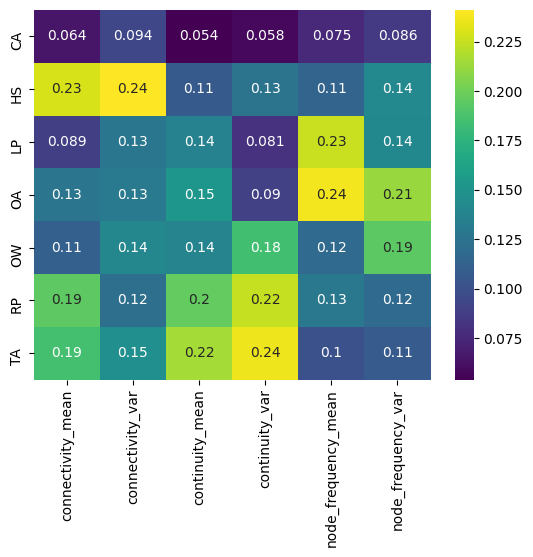

In [15]:
fs = feature_scoring.get_feature_scores_all(BR_LHS_experiments4444[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']], BR_LHS_outcomes4444)
heatmap = sns.heatmap(fs.rename_axis(index=None, columns=None), cmap="viridis", annot=True)
plt.savefig('BR_LHS_ETRF_seed4444.png', bbox_inches='tight')

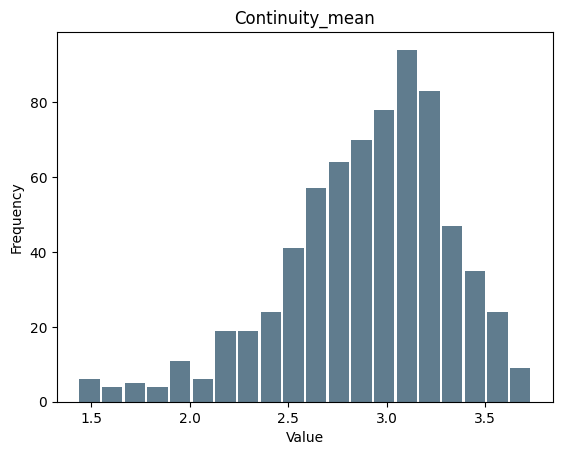

In [18]:
histogram = pd.Series(BR_LHS_outcomes4444.get("continuity_mean"))
fig, ax = plt.subplots()
ax.hist(histogram, bins=20, rwidth=0.9,
                       color='#607c8e')
ax.set_title("Continuity_mean")
ax.set_xlabel('Value')
ax.set_ylabel('Frequency')

plt.savefig('BR_LHS_continuity_mean_hist_seed4444.png', bbox_inches='tight')

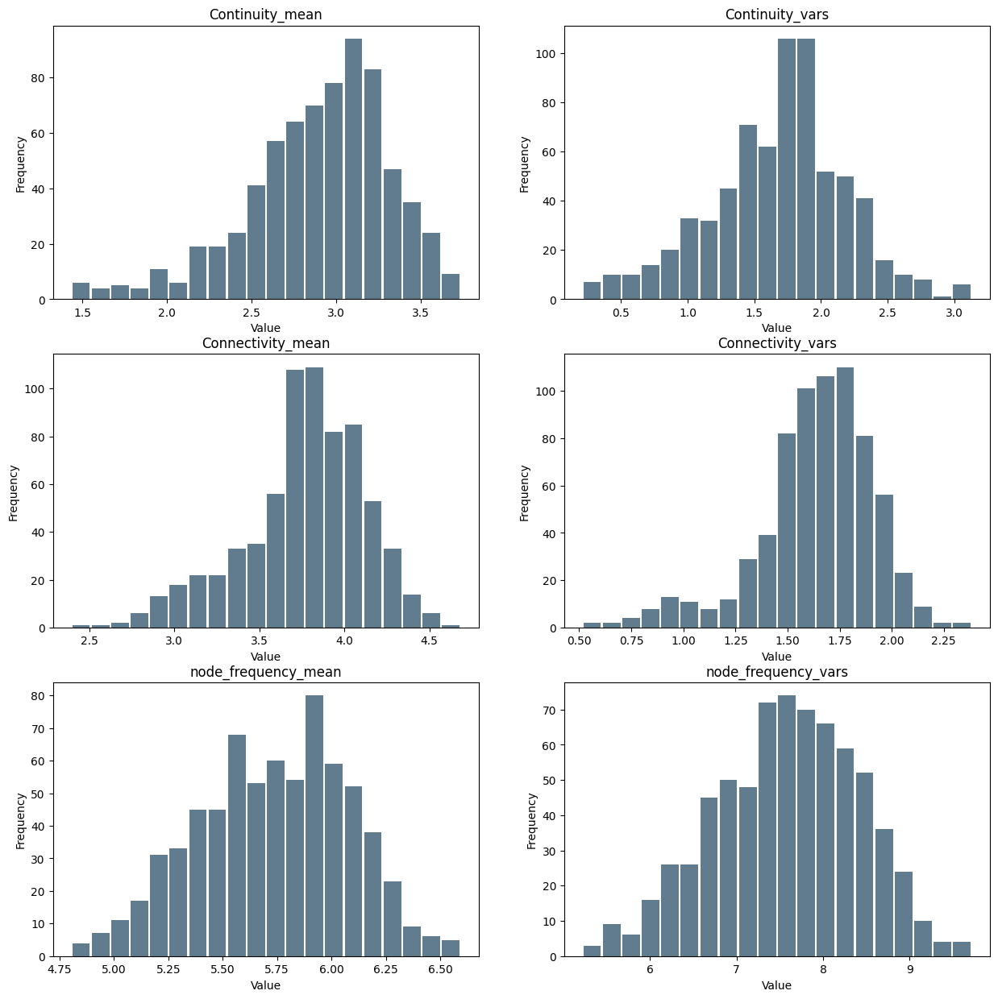

In [59]:
make_histogram_full(BR_LHS_ourtomes4444)

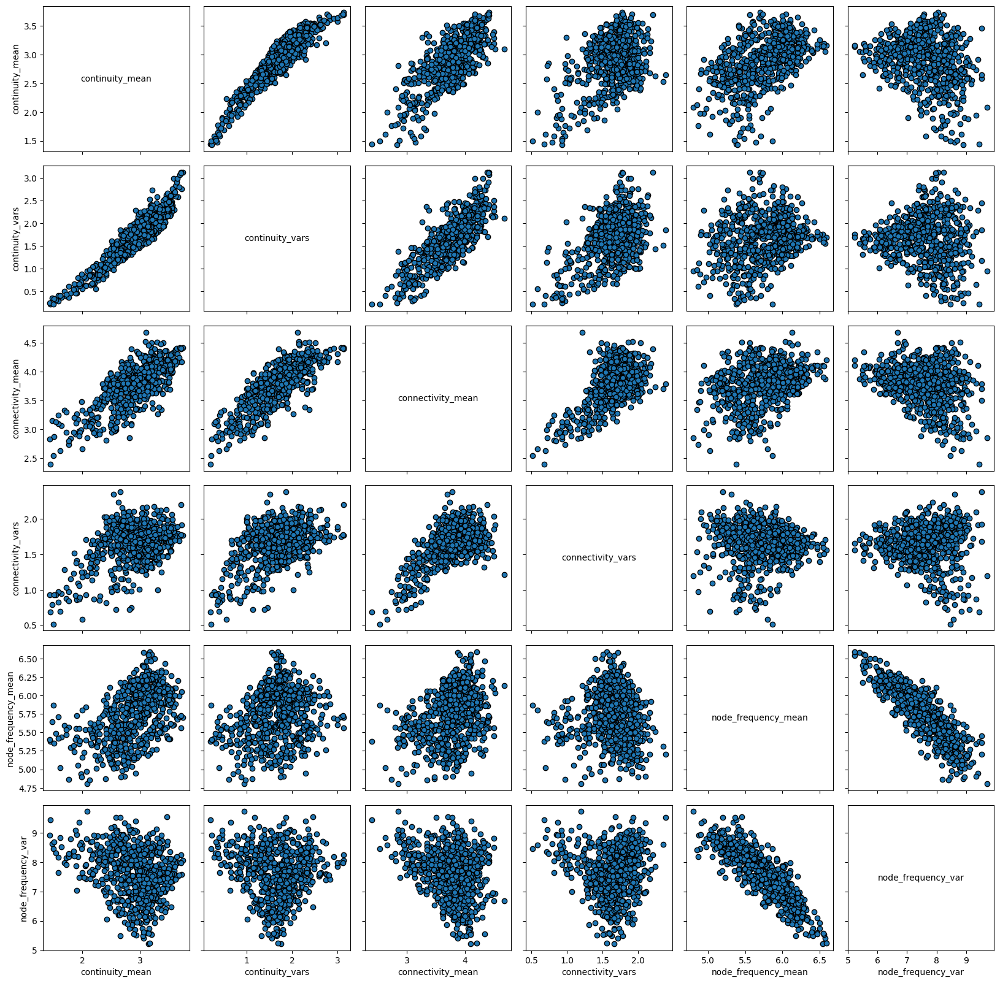

In [64]:
fig, axes = pairs_plotting.pairs_scatter(BR_LHS_experiments4444, BR_LHS_ourtomes4444, legend=True)
fig.set_size_inches(20, 20)
plt.show()

In [48]:
corr_mat = pd.DataFrame(columns=['continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var'])
p_mat = pd.DataFrame()
for value1 in ['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']:
    for value2 in ['continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var']:
        corr_mat.at[value1, value2] = scipy.stats.kendalltau(BR_LHS_experiments4444[value1], pd.DataFrame(BR_LHS_outcomes4444)[value2])[0]
        p_mat.at[value1, value2] = scipy.stats.kendalltau(BR_LHS_experiments4444[value1], pd.DataFrame(BR_LHS_outcomes4444)[value2])[1]
     

In [53]:
corr_mat.astype(float).round(3)

,continuity_mean,continuity_var,connectivity_mean,connectivity_var,node_frequency_mean,node_frequency_var
CA,-0.015,-0.017,0.007,0.035,-0.027,0.025
HS,0.161,0.171,0.265,0.180,0.158,-0.157
LP,0.221,0.083,-0.138,-0.103,0.291,-0.144
OA,0.241,0.104,0.184,-0.101,0.320,-0.264
OW,0.219,0.286,0.135,0.116,-0.154,0.221
RP,-0.317,-0.308,-0.294,-0.087,-0.170,0.071
TA,0.341,0.361,0.298,0.157,0.109,-0.086


In [51]:
p_mat.round(3)

,continuity_mean,continuity_var,connectivity_mean,connectivity_var,node_frequency_mean,node_frequency_var
CA,0.562,0.506,0.776,0.167,0.286,0.317
HS,0.000,0.000,0.000,0.000,0.000,0.000
LP,0.000,0.001,0.000,0.000,0.000,0.000
OA,0.000,0.000,0.000,0.000,0.000,0.000
OW,0.000,0.000,0.000,0.000,0.000,0.000
RP,0.000,0.000,0.000,0.001,0.000,0.005
TA,0.000,0.000,0.000,0.000,0.000,0.001


In [50]:
p_mat

,continuity_mean,continuity_var,connectivity_mean,connectivity_var,node_frequency_mean,node_frequency_var
CA,5.621775e-01,5.056066e-01,7.763018e-01,1.674084e-01,2.858313e-01,3.165292e-01
HS,2.045125e-10,1.263141e-11,8.819874e-26,1.058817e-12,4.186506e-10,4.949510e-10
LP,2.396533e-18,1.072187e-03,4.704744e-08,4.387333e-05,1.148563e-30,1.258750e-08
OA,1.319728e-21,3.967310e-05,3.093258e-13,6.644658e-05,8.866556e-37,1.380659e-25
OW,3.730852e-18,1.120126e-29,8.772484e-08,4.615590e-06,1.197576e-09,2.295745e-18
RP,3.627153e-36,3.109358e-34,2.256447e-31,5.821494e-04,1.662074e-11,5.172183e-03
TA,1.212381e-41,2.148829e-46,3.245902e-32,5.286972e-10,1.641965e-05,6.651582e-04


### Seed 5555

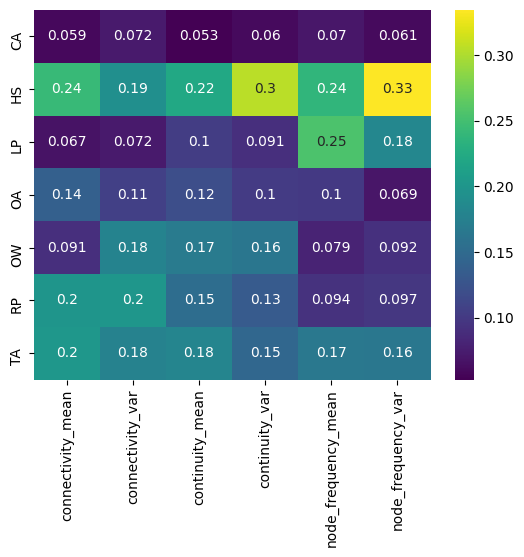

In [16]:
fs = feature_scoring.get_feature_scores_all(BR_LHS_experiments5555[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']], BR_LHS_outcomes5555)
heatmap = sns.heatmap(fs.rename_axis(index=None, columns=None), cmap="viridis", annot=True)
plt.savefig('BR_LHS_ETRF_seed5555.png', bbox_inches='tight')

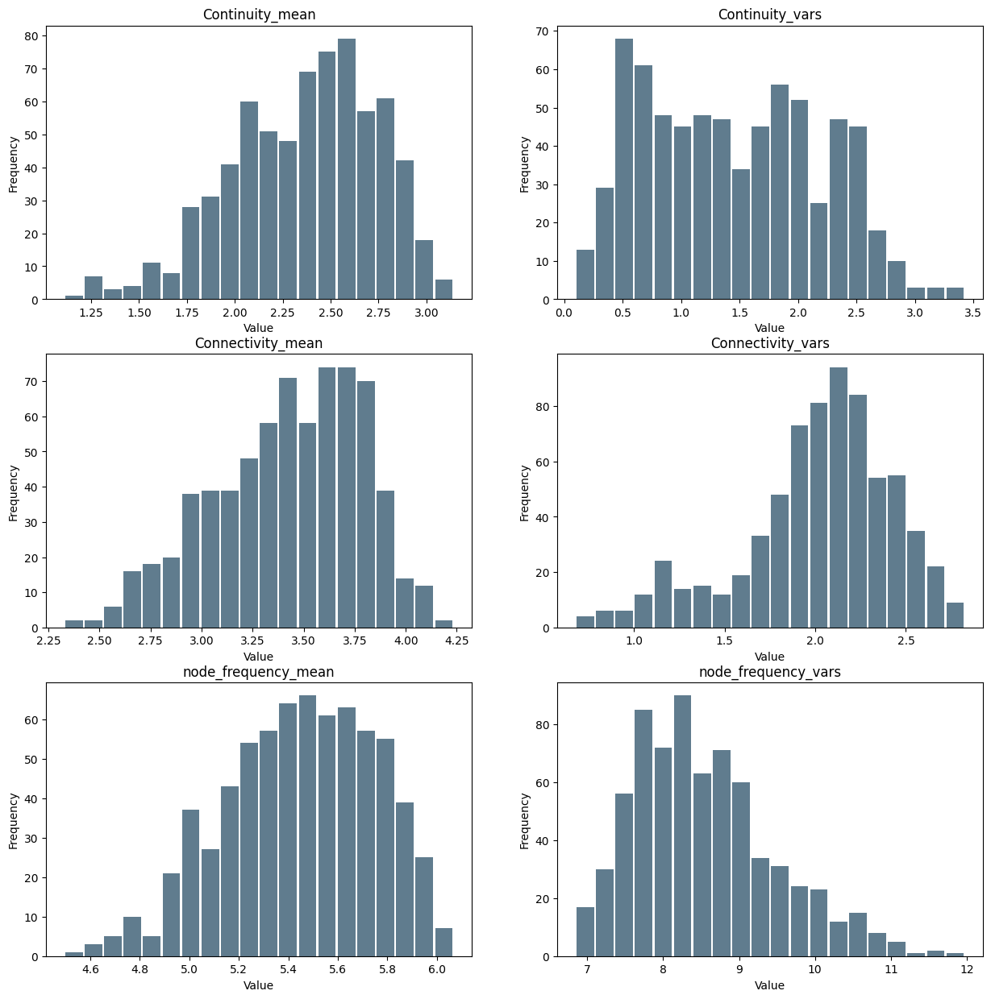

In [60]:
make_histogram_full(BR_LHS_ourtomes5555)

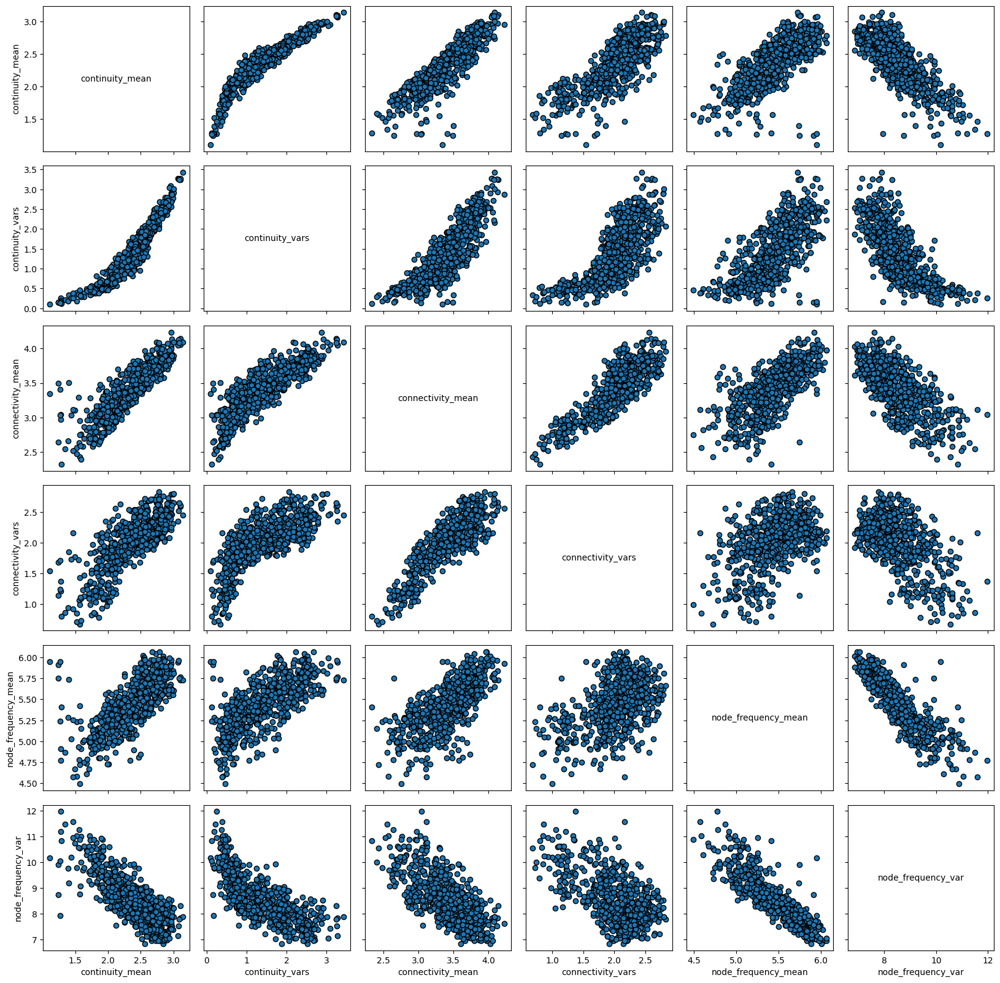

In [65]:
fig, axes = pairs_plotting.pairs_scatter(BR_LHS_experiments5555, BR_LHS_ourtomes5555, legend=True)
fig.set_size_inches(20, 20)
plt.show()

In [54]:
corr_mat = pd.DataFrame(columns=['continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var'])
p_mat = pd.DataFrame()
for value1 in ['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']:
    for value2 in ['continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var']:
        corr_mat.at[value1, value2] = scipy.stats.kendalltau(BR_LHS_experiments5555[value1], pd.DataFrame(BR_LHS_outcomes5555)[value2])[0]
        p_mat.at[value1, value2] = scipy.stats.kendalltau(BR_LHS_experiments5555[value1], pd.DataFrame(BR_LHS_outcomes5555)[value2])[1]
     

In [55]:
corr_mat.astype(float).round(3)

,continuity_mean,continuity_var,connectivity_mean,connectivity_var,node_frequency_mean,node_frequency_var
CA,0.012,0.034,0.012,0.007,0.018,-0.030
HS,0.324,0.383,0.319,0.174,0.341,-0.384
LP,0.173,0.148,0.070,-0.073,0.341,-0.289
OA,0.195,0.164,0.234,0.143,0.120,0.015
OW,0.259,0.254,0.129,0.287,0.045,-0.109
RP,-0.243,-0.209,-0.296,-0.294,-0.125,0.142
TA,0.307,0.261,0.319,0.273,0.241,-0.258


In [58]:
p_mat.round(3)

,continuity_mean,continuity_var,connectivity_mean,connectivity_var,node_frequency_mean,node_frequency_var
CA,0.628,0.182,0.642,0.790,0.469,0.238
HS,0.000,0.000,0.000,0.000,0.000,0.000
LP,0.000,0.000,0.006,0.004,0.000,0.000
OA,0.000,0.000,0.000,0.000,0.000,0.546
OW,0.000,0.000,0.000,0.000,0.073,0.000
RP,0.000,0.000,0.000,0.000,0.000,0.000
TA,0.000,0.000,0.000,0.000,0.000,0.000


In [56]:
p_mat

,continuity_mean,continuity_var,connectivity_mean,connectivity_var,node_frequency_mean,node_frequency_var
CA,6.278264e-01,1.824235e-01,6.421293e-01,7.904740e-01,4.685027e-01,2.378984e-01
HS,1.382433e-37,6.686083e-52,1.829580e-36,5.284449e-12,1.606227e-41,2.846652e-52
LP,7.597624e-12,4.978703e-09,5.736884e-03,4.002221e-03,1.557592e-41,2.492299e-30
OA,1.151124e-14,8.531211e-11,1.903541e-20,1.483881e-08,2.010005e-06,5.463525e-01
OW,1.324163e-24,9.732398e-24,3.248949e-07,5.713286e-30,7.335581e-02,1.603955e-05
RP,7.392329e-22,1.199575e-16,1.163409e-31,2.099311e-31,7.833506e-07,1.845684e-08
TA,6.979833e-34,4.656003e-25,1.333177e-36,3.288780e-27,1.303342e-21,1.544229e-24


### Seed 6666

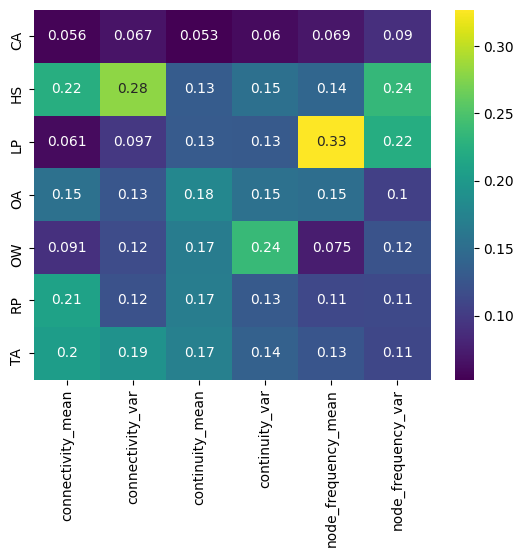

In [17]:
fs = feature_scoring.get_feature_scores_all(BR_LHS_experiments6666[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']], BR_LHS_outcomes6666)
heatmap = sns.heatmap(fs.rename_axis(index=None, columns=None), cmap="viridis", annot=True)
plt.savefig('BR_LHS_ETRF_seed6666.png', bbox_inches='tight')

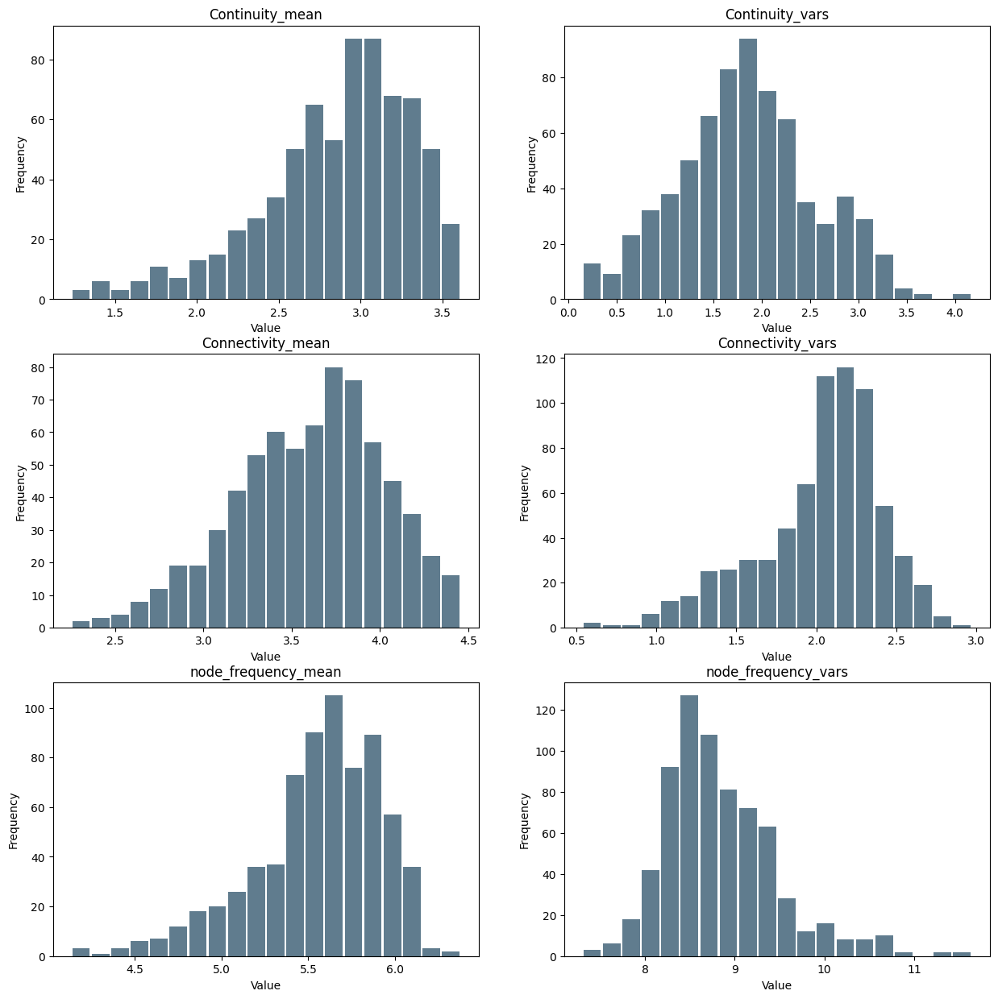

In [61]:
make_histogram_full(BR_LHS_ourtomes6666)

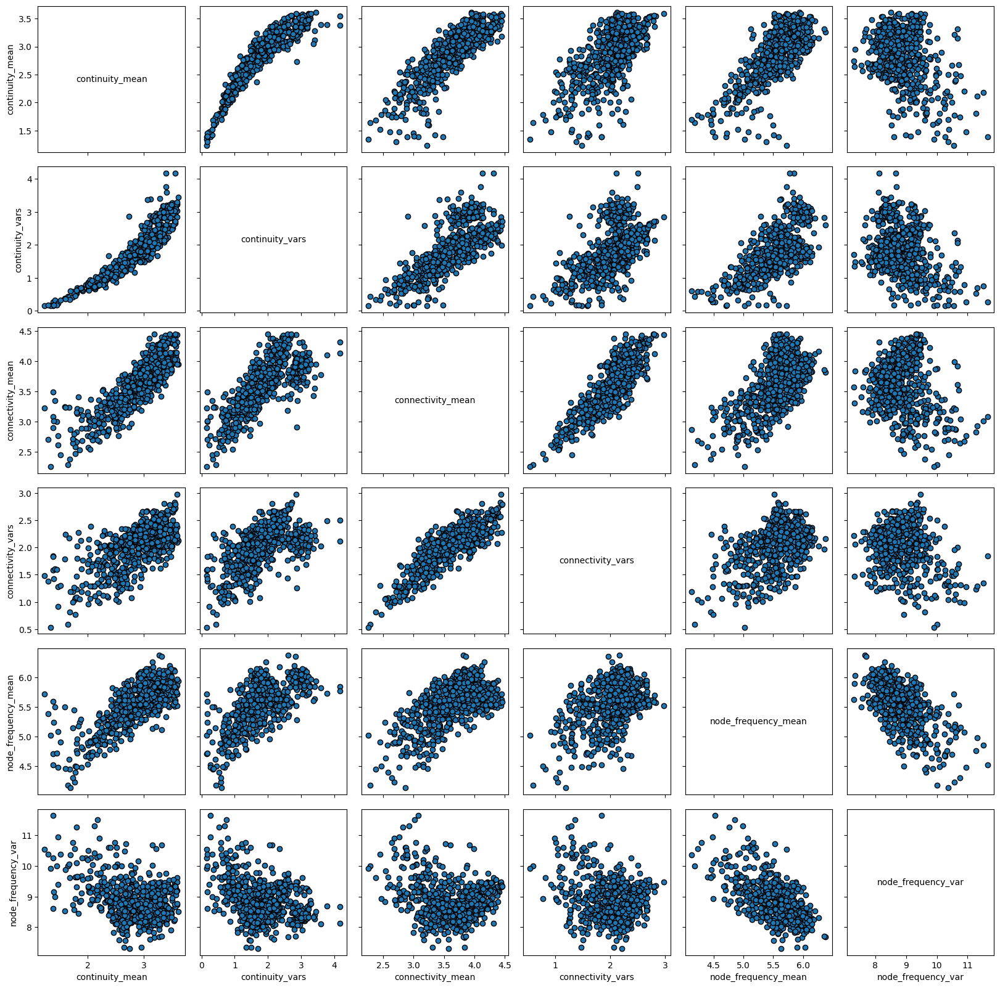

In [66]:
fig, axes = pairs_plotting.pairs_scatter(BR_LHS_experiments6666, BR_LHS_ourtomes6666, legend=True)
fig.set_size_inches(20, 20)
plt.show()

In [59]:
corr_mat = pd.DataFrame(columns=['continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var'])
p_mat = pd.DataFrame()
for value1 in ['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']:
    for value2 in ['continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var']:
        corr_mat.at[value1, value2] = scipy.stats.kendalltau(BR_LHS_experiments6666[value1], pd.DataFrame(BR_LHS_outcomes6666)[value2])[0]
        p_mat.at[value1, value2] = scipy.stats.kendalltau(BR_LHS_experiments6666[value1], pd.DataFrame(BR_LHS_outcomes6666)[value2])[1]
  

In [60]:
corr_mat.astype(float).round(3)

,continuity_mean,continuity_var,connectivity_mean,connectivity_var,node_frequency_mean,node_frequency_var
CA,-0.003,0.008,-0.021,-0.050,0.005,0.038
HS,0.193,0.236,0.294,0.312,0.189,-0.169
LP,0.186,0.171,-0.011,-0.097,0.430,-0.326
OA,0.258,0.236,0.249,0.177,0.223,0.075
OW,0.277,0.332,0.135,0.151,0.016,-0.089
RP,-0.277,-0.180,-0.309,-0.150,-0.171,-0.123
TA,0.304,0.241,0.321,0.272,0.190,-0.066


In [61]:
p_mat.round(3)

,continuity_mean,continuity_var,connectivity_mean,connectivity_var,node_frequency_mean,node_frequency_var
CA,0.895,0.741,0.411,0.047,0.830,0.137
HS,0.000,0.000,0.000,0.000,0.000,0.000
LP,0.000,0.000,0.673,0.000,0.000,0.000
OA,0.000,0.000,0.000,0.000,0.000,0.003
OW,0.000,0.000,0.000,0.000,0.538,0.000
RP,0.000,0.000,0.000,0.000,0.000,0.000
TA,0.000,0.000,0.000,0.000,0.000,0.009


In [62]:
p_mat

,continuity_mean,continuity_var,connectivity_mean,connectivity_var,node_frequency_mean,node_frequency_var
CA,8.952098e-01,7.408382e-01,4.110743e-01,4.745732e-02,8.298560e-01,1.372578e-01
HS,1.992451e-14,7.912101e-21,2.626443e-31,4.671377e-35,6.738760e-14,2.121677e-11
LP,1.549596e-13,1.170533e-11,6.734935e-01,1.164942e-04,6.963134e-65,4.335752e-38
OA,1.449253e-24,1.067698e-20,7.160536e-23,2.693316e-12,9.102979e-19,3.113505e-03
OW,4.842947e-28,1.780698e-39,9.729629e-08,2.045395e-09,5.375623e-01,4.058697e-04
RP,4.573135e-28,1.099352e-12,1.663886e-34,2.887844e-09,1.317980e-11,1.209752e-06
TA,2.247770e-33,1.311510e-21,6.139543e-37,5.124137e-27,5.381595e-14,8.544337e-03


# Combined results

## Combining

In [17]:
outcomes_combined = {}
outcomes_combined['continuity_mean'] = np.concatenate((BR_LHS_outcomes2222['continuity_mean'], BR_LHS_outcomes3333['continuity_mean'], BR_LHS_outcomes4444['continuity_mean'], BR_LHS_outcomes5555['continuity_mean'], BR_LHS_outcomes6666['continuity_mean']))
outcomes_combined['continuity_var'] = np.concatenate((BR_LHS_outcomes2222['continuity_var'], BR_LHS_outcomes3333['continuity_var'], BR_LHS_outcomes4444['continuity_var'], BR_LHS_outcomes5555['continuity_var'], BR_LHS_outcomes6666['continuity_var']))
outcomes_combined['connectivity_mean'] = np.concatenate((BR_LHS_outcomes2222['connectivity_mean'], BR_LHS_outcomes3333['connectivity_mean'], BR_LHS_outcomes4444['connectivity_mean'], BR_LHS_outcomes5555['connectivity_mean'], BR_LHS_outcomes6666['connectivity_mean']))
outcomes_combined['connectivity_var'] = np.concatenate((BR_LHS_outcomes2222['connectivity_var'], BR_LHS_outcomes3333['connectivity_var'], BR_LHS_outcomes4444['connectivity_var'], BR_LHS_outcomes5555['connectivity_var'], BR_LHS_outcomes6666['connectivity_var']))
outcomes_combined['node_frequency_mean'] = np.concatenate((BR_LHS_outcomes2222['node_frequency_mean'], BR_LHS_outcomes3333['node_frequency_mean'], BR_LHS_outcomes4444['node_frequency_mean'], BR_LHS_outcomes5555['node_frequency_mean'], BR_LHS_outcomes6666['node_frequency_mean']))
outcomes_combined['node_frequency_var'] = np.concatenate((BR_LHS_outcomes2222['node_frequency_var'], BR_LHS_outcomes3333['node_frequency_var'], BR_LHS_outcomes4444['node_frequency_var'], BR_LHS_outcomes5555['node_frequency_var'], BR_LHS_outcomes6666['node_frequency_var']))


In [18]:
BR_LHS_experiments2222['seed']=2222
BR_LHS_experiments3333['seed']=3333
BR_LHS_experiments4444['seed']=4444
BR_LHS_experiments5555['seed']=5555
BR_LHS_experiments6666['seed']=6666


In [19]:
experiments_combined = pd.concat([BR_LHS_experiments2222, BR_LHS_experiments3333, BR_LHS_experiments4444, BR_LHS_experiments5555, BR_LHS_experiments6666], ignore_index=True, sort=False)

In [26]:
experiments_combined['continuity_mean'] = outcomes_combined['continuity_mean']
experiments_combined['continuity_var'] = outcomes_combined['continuity_var']
experiments_combined['connectivity_mean'] = outcomes_combined['connectivity_mean']
experiments_combined['connectivity_var'] = outcomes_combined['connectivity_var']
experiments_combined['node_frequency_mean'] = outcomes_combined['node_frequency_mean']
experiments_combined['node_frequency_var'] = outcomes_combined['node_frequency_var']

## Plotting results

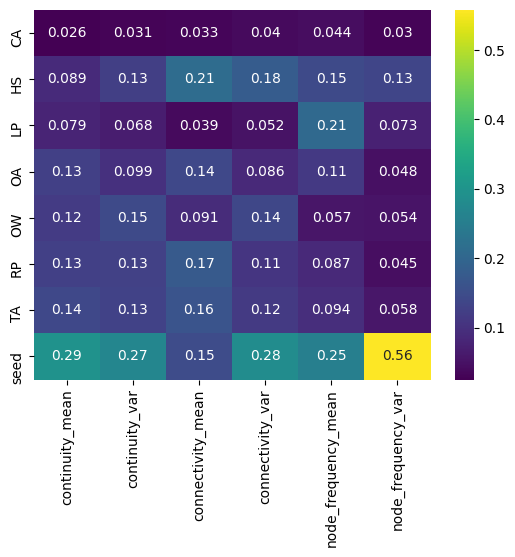

In [22]:
fs = feature_scoring.get_feature_scores_all(experiments_combined[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA', 'seed']], outcomes_combined)
heatmap = sns.heatmap(fs.rename_axis(index=None, columns=None), cmap="viridis", annot=True)
plt.savefig('BR_LHS_ETRF_combined_with_seed.png', bbox_inches='tight')

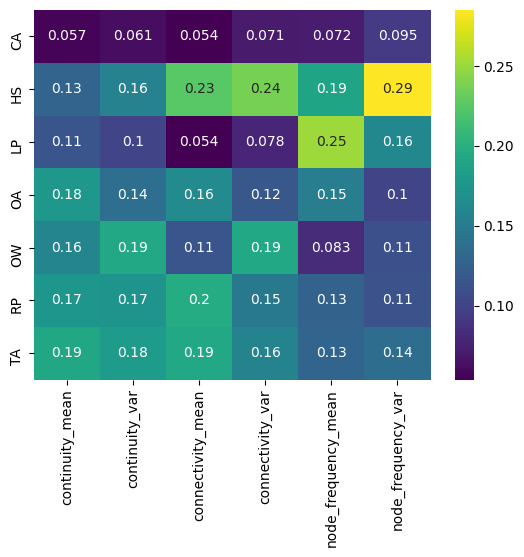

In [23]:
fs = feature_scoring.get_feature_scores_all(experiments_combined[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']], outcomes_combined)
heatmap = sns.heatmap(fs.rename_axis(index=None, columns=None), cmap="viridis", annot=True)
plt.savefig('BR_LHS_ETRF_combined_without_seed.png', bbox_inches='tight')

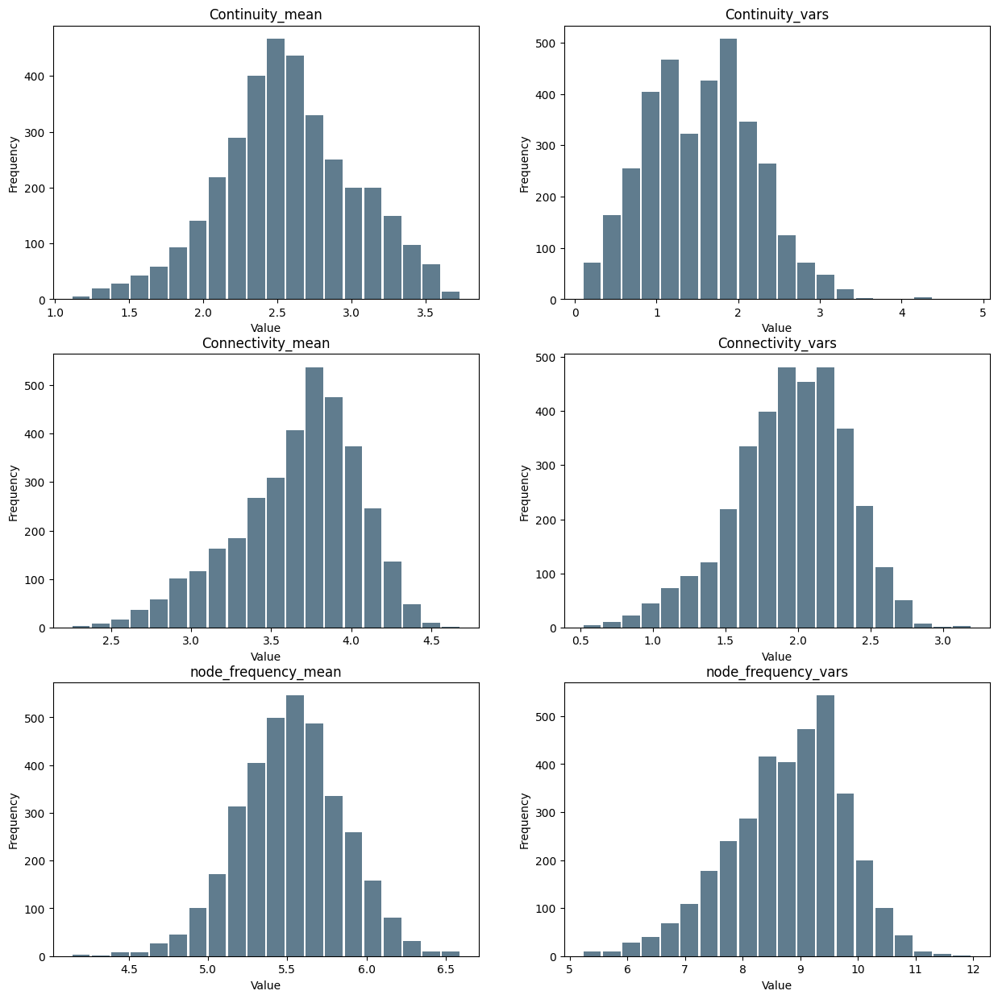

In [67]:
make_histogram_full(outcomes_combined)

In [29]:
experiments_combined.keys()

Index(['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA', 'scenario', 'policy', 'model',
       'seed'],
      dtype='object')

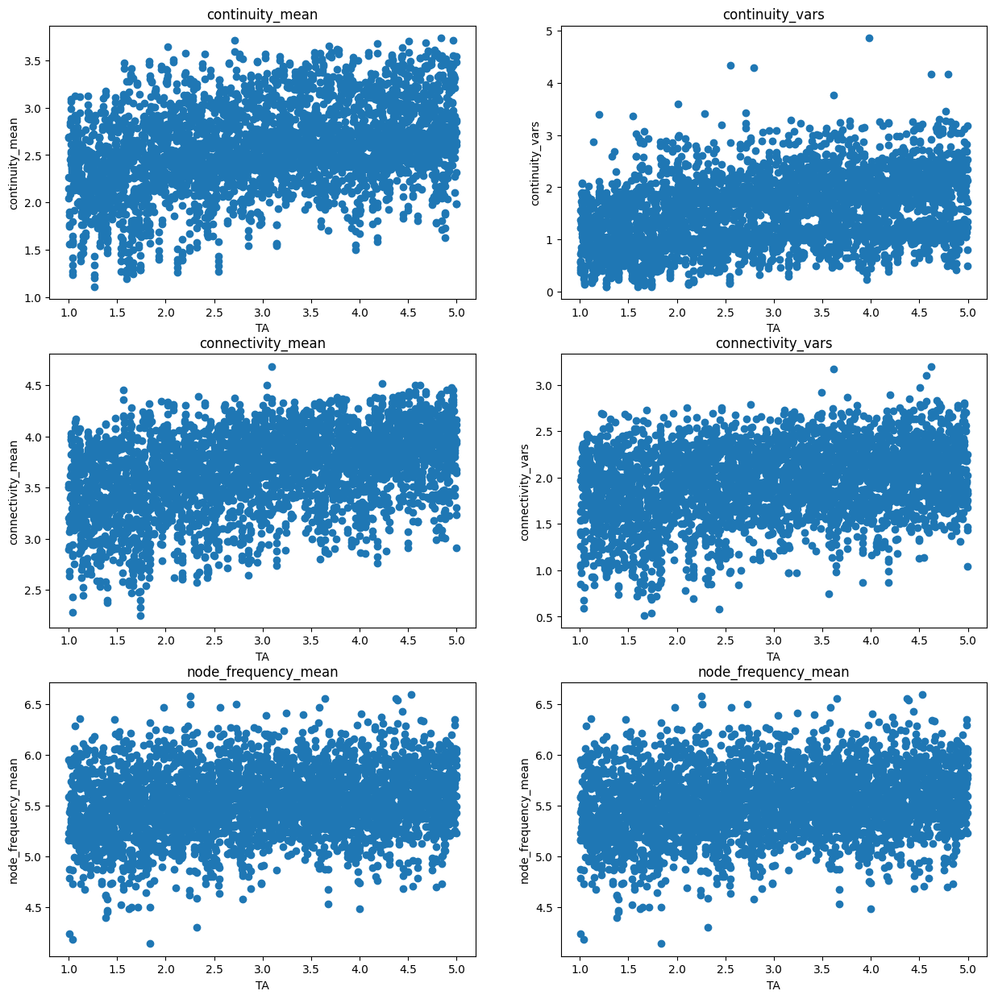

In [27]:
make_scatterplot_full('TA')

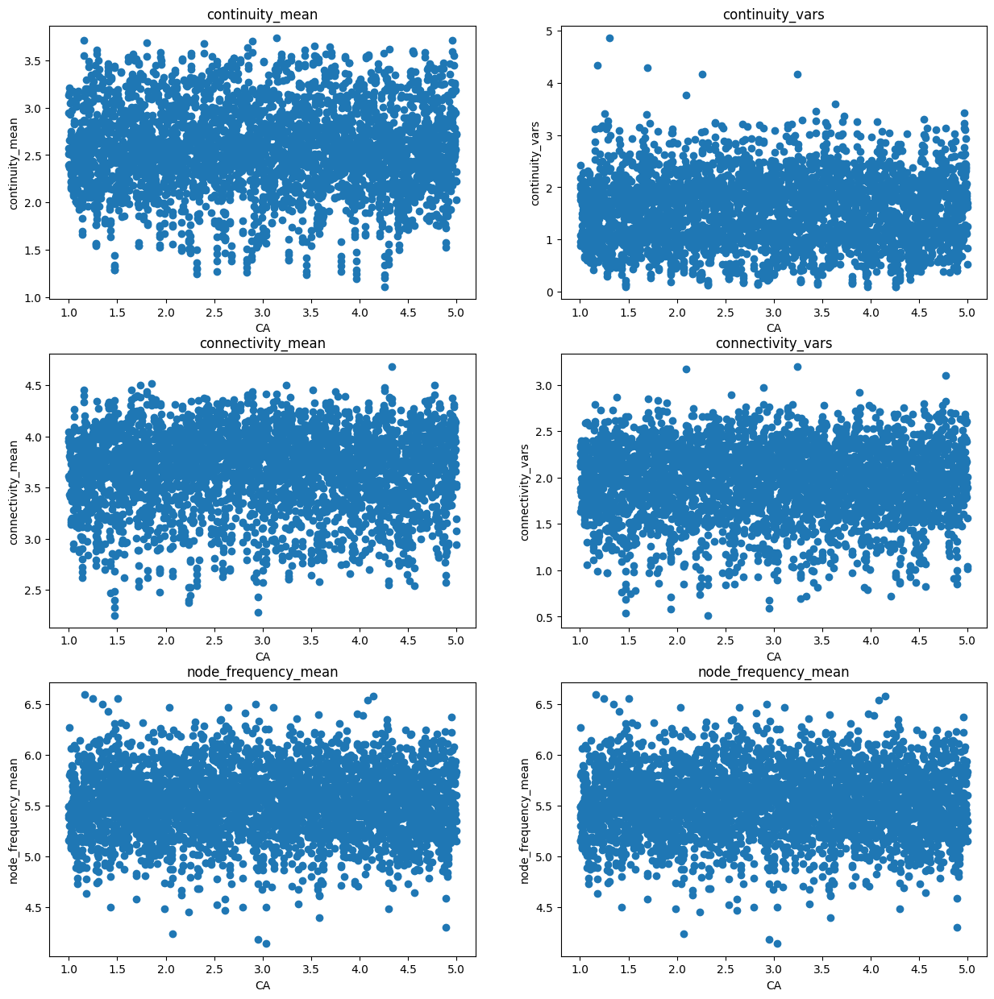

In [30]:
make_scatterplot_full('CA')

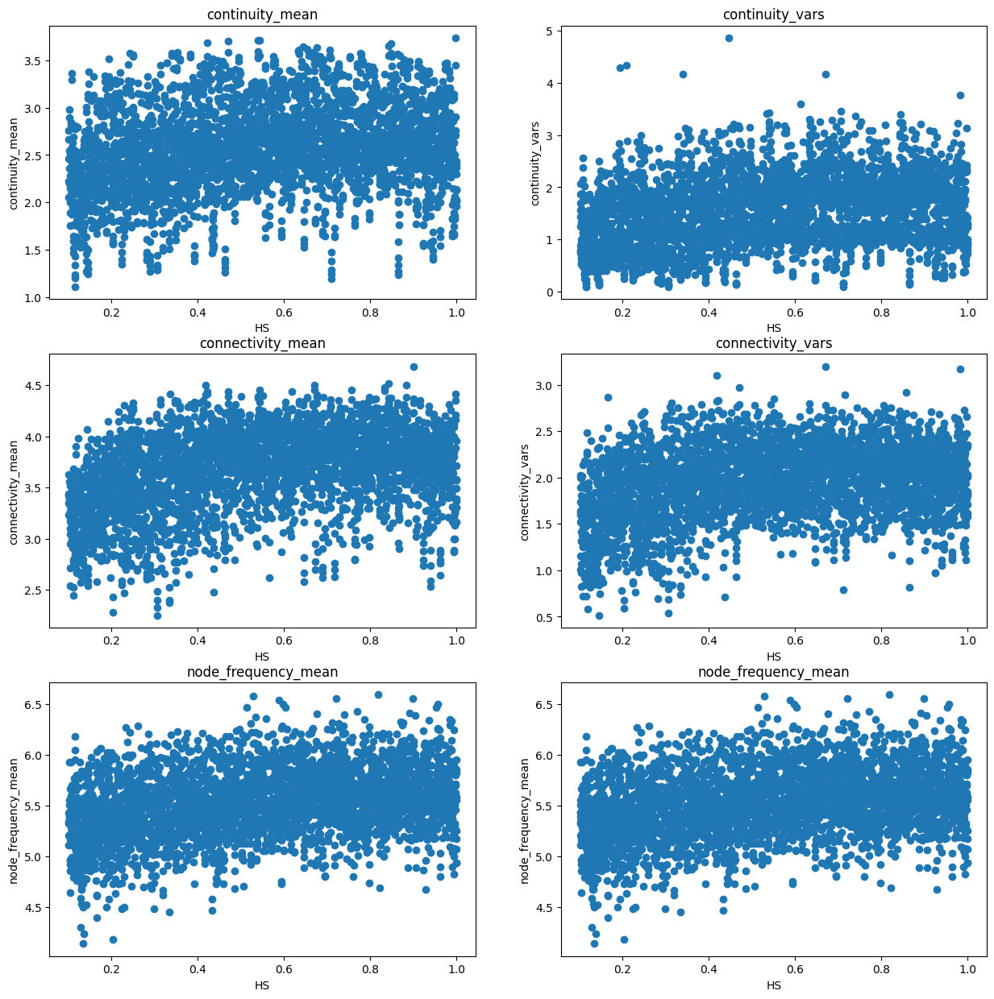

In [31]:
make_scatterplot_full('HS')

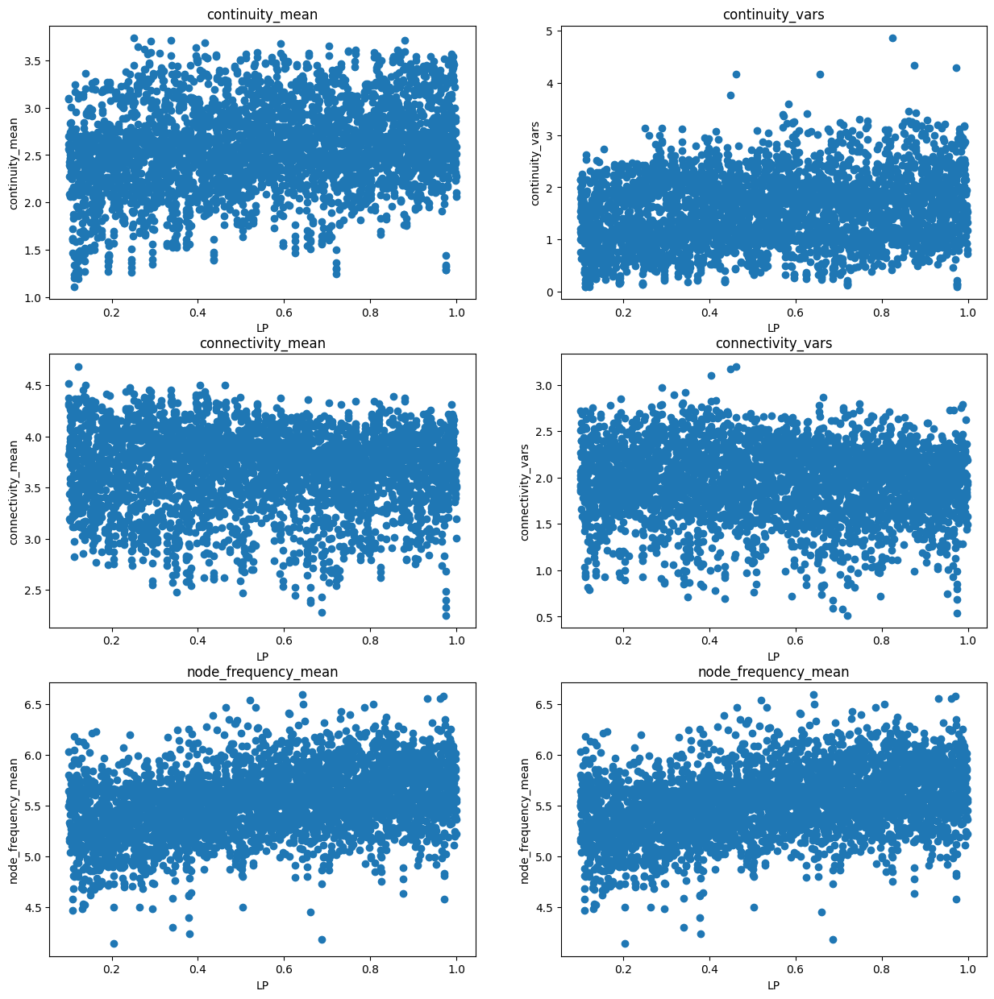

In [32]:
make_scatterplot_full('LP')

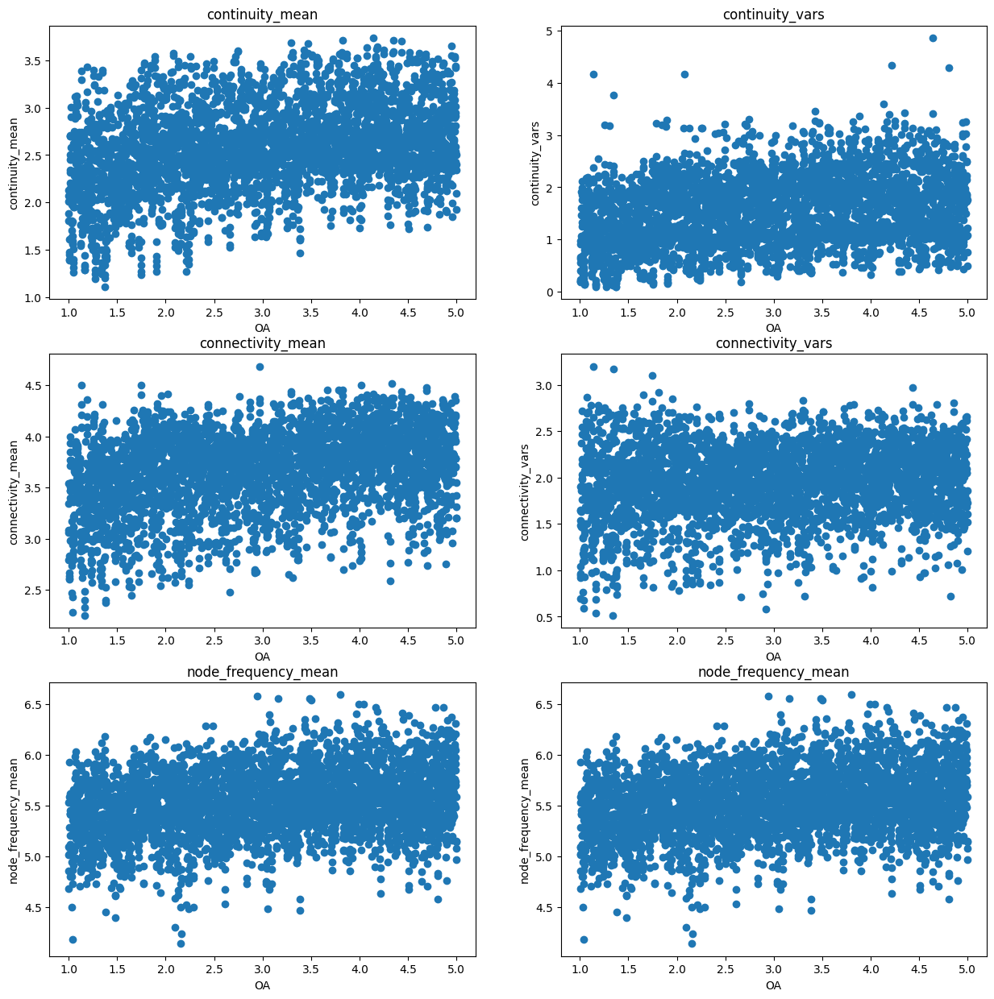

In [33]:
make_scatterplot_full('OA')

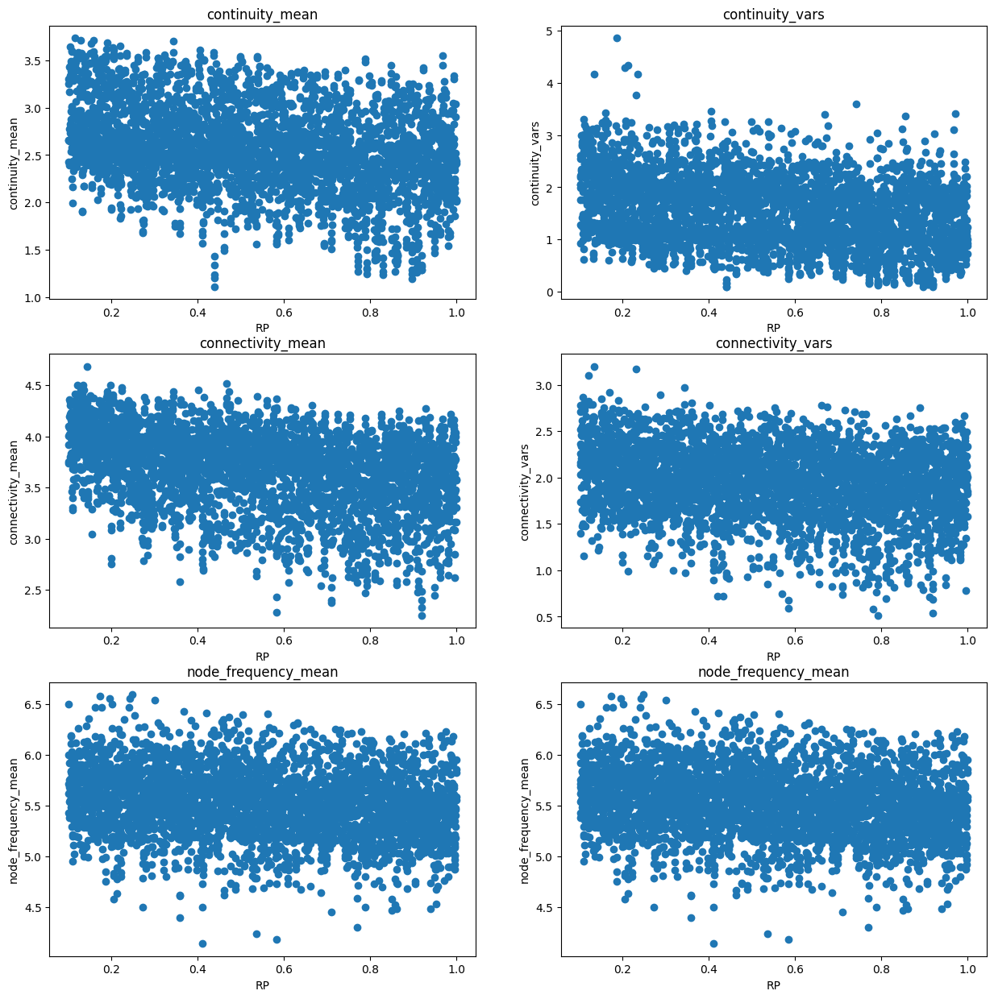

In [34]:
make_scatterplot_full('RP')

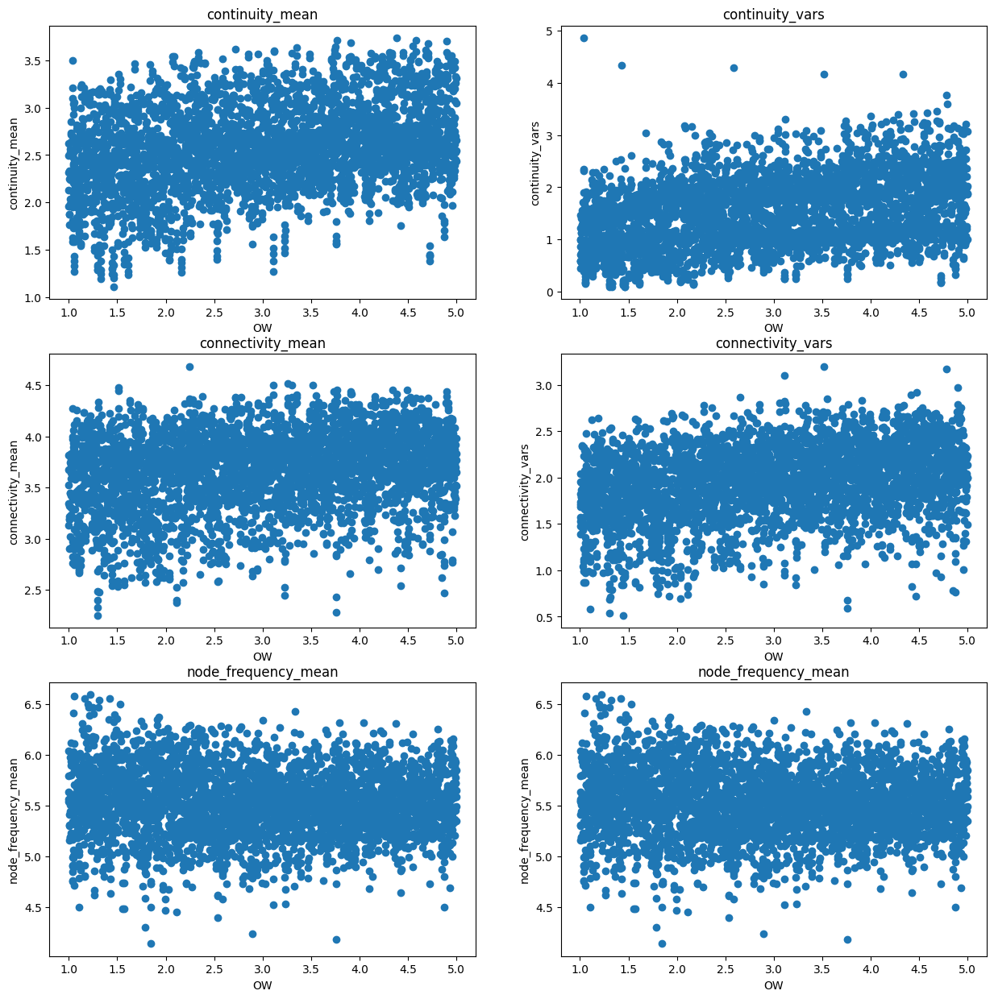

In [35]:
make_scatterplot_full('OW')

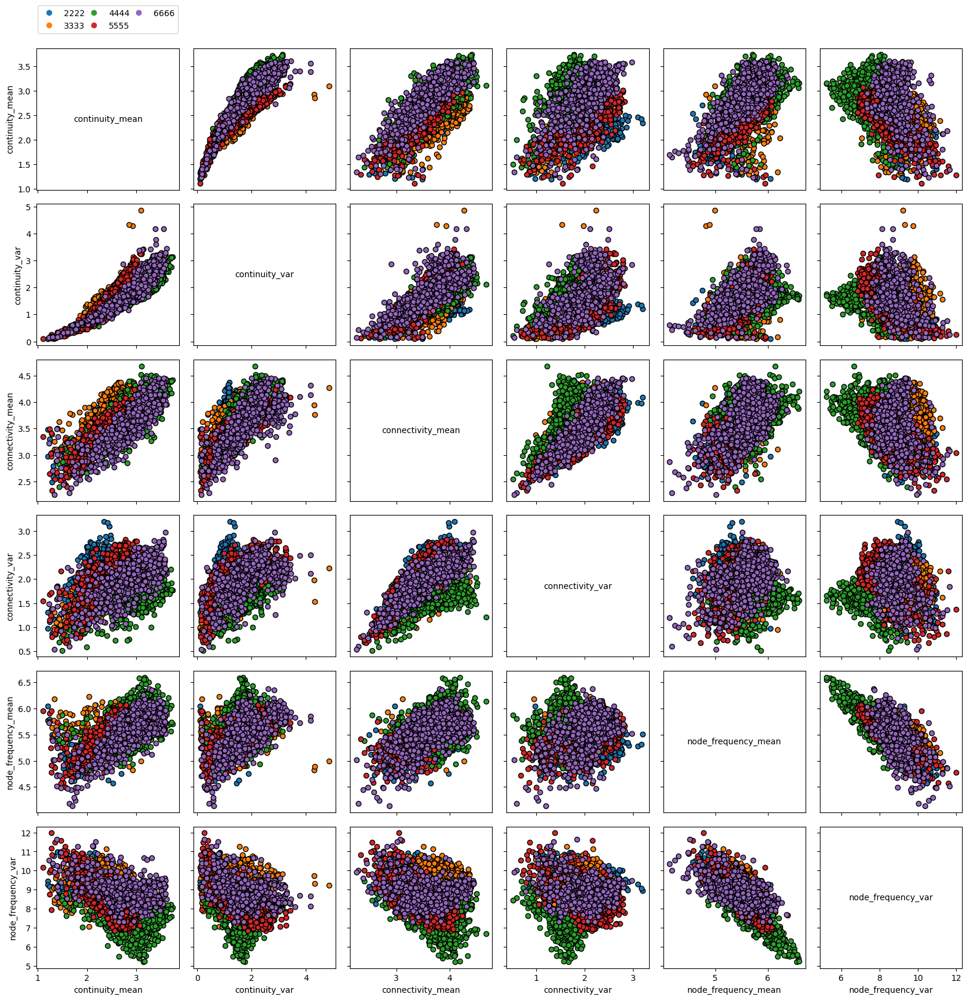

In [25]:
fig, axes = pairs_plotting.pairs_scatter(experiments_combined, outcomes_combined, group_by='seed', grouping_specifiers = {2222: 2222, 3333:3333, 4444:4444, 5555:5555, 6666:6666}, legend=True)
fig.set_size_inches(20, 20)
# plt.show()

plt.savefig('corr_BR_run_run_all.png', bbox_inches='tight')

In [20]:
experiments_combined.keys()

Index(['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA', 'scenario', 'policy', 'model',
       'seed'],
      dtype='object')

In [25]:
outcomes_combined.keys()

dict_keys(['continuity_mean', 'continuity_vars', 'connectivity_mean', 'connectivity_vars', 'node_frequency_mean', 'node_frequency_var'])

In [26]:
dict((k, outcomes_combined[k]) for k in ('continuity_mean', 'continuity_vars'))

{'continuity_mean': array([2.14990114, 2.41171407, 1.43381649, ..., 3.27478533, 2.07263288,
        2.74367282]),
 'continuity_vars': array([0.84285917, 1.10682278, 0.26837064, ..., 2.25895768, 0.91690785,
        1.67362142])}

In [21]:
experiments_combined.keys()

Index(['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA', 'scenario', 'policy', 'model',
       'seed'],
      dtype='object')

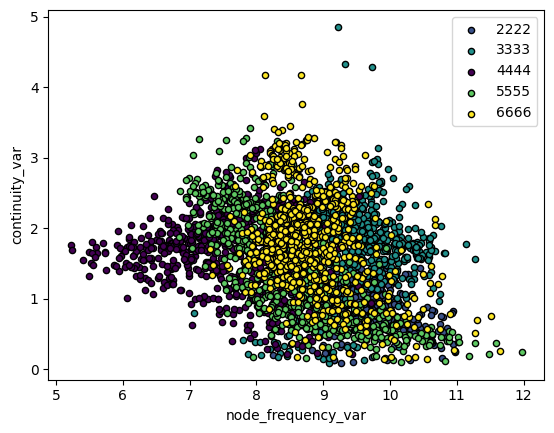

In [32]:
fig, ax = plt.subplots()
colors = {2222:'#3b528b', 3333:'#21918c', 4444:'#440154', 5555:'#5ec962', 6666:'#fde725'}

grouped = experiments_combined.groupby('seed')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='node_frequency_var', y='continuity_var', label=key, color=colors[key], edgecolor='black')

# plt.show()
plt.savefig('corr_nf_var_and_continuity_var_BR.png', bbox_inches='tight')


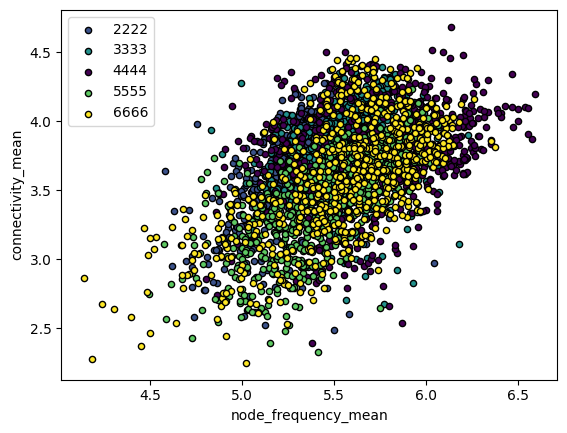

In [30]:
fig, ax = plt.subplots()
colors = {2222:'#3b528b', 3333:'#21918c', 4444:'#440154', 5555:'#5ec962', 6666:'#fde725'}

grouped = experiments_combined.groupby('seed')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='node_frequency_mean', y='connectivity_mean', label=key, color=colors[key], edgecolor='black')

# plt.show()
plt.savefig('corr_nf_mean_and_connectivity_mean_BR.png', bbox_inches='tight')


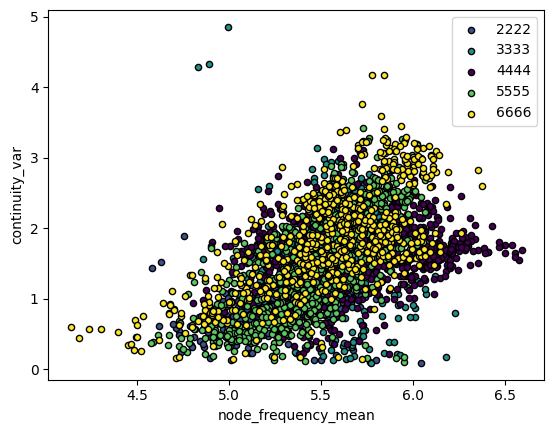

In [29]:
fig, ax = plt.subplots()
colors = {2222:'#3b528b', 3333:'#21918c', 4444:'#440154', 5555:'#5ec962', 6666:'#fde725'}

grouped = experiments_combined.groupby('seed')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='node_frequency_mean', y='continuity_var', label=key, color=colors[key], edgecolor='black')

# plt.show()
plt.savefig('corr_nf_mean_and_continuity__BR.png', bbox_inches='tight')


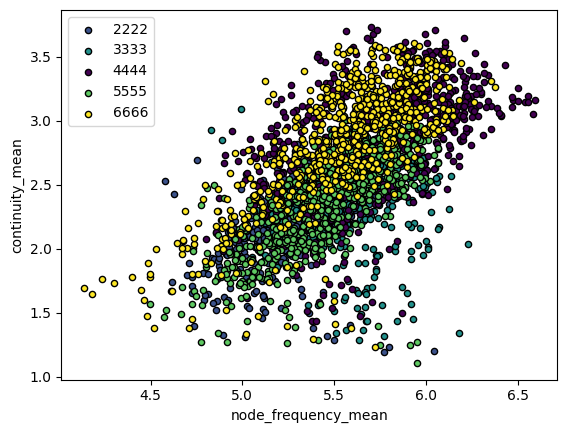

In [28]:
fig, ax = plt.subplots()
colors = {2222:'#3b528b', 3333:'#21918c', 4444:'#440154', 5555:'#5ec962', 6666:'#fde725'}

grouped = experiments_combined.groupby('seed')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='node_frequency_mean', y='continuity_mean', label=key, color=colors[key], edgecolor='black')

# plt.show()
plt.savefig('corr_nf_mean_and_continuity_mean_BR.png', bbox_inches='tight')


C:\Users\Willemijn Tutuarima\miniconda3\envs\gds\lib\site-packages\pandas\plotting\_matplotlib\core.py:1070: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


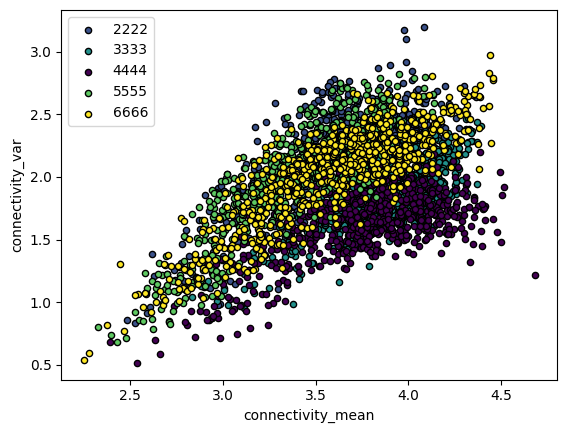

In [27]:
fig, ax = plt.subplots()
colors = {2222:'#3b528b', 3333:'#21918c', 4444:'#440154', 5555:'#5ec962', 6666:'#fde725'}

grouped = experiments_combined.groupby('seed')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='connectivity_mean', y='connectivity_var', label=key, color=colors[key], edgecolor='black')

# plt.show()
plt.savefig('corr_connectivity_mean_and_var_BR.png', bbox_inches='tight')


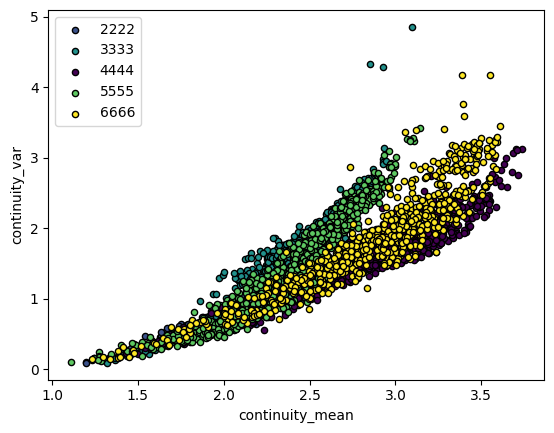

In [85]:
fig, ax = plt.subplots()
colors = {2222:'#3b528b', 3333:'#21918c', 4444:'#440154', 5555:'#5ec962', 6666:'#fde725'}

grouped = experiments_combined.groupby('seed')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='continuity_mean', y='continuity_var', label=key, color=colors[key], edgecolor='black')

# plt.show()
plt.savefig('corr_continuity_mean_and_var.png', bbox_inches='tight')


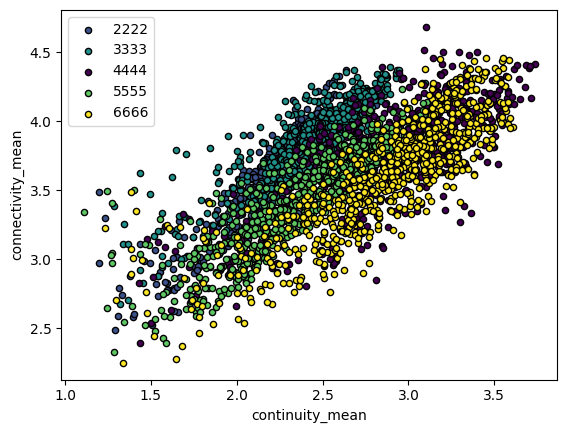

In [81]:
fig, ax = plt.subplots()
colors = {2222:'#3b528b', 3333:'#21918c', 4444:'#440154', 5555:'#5ec962', 6666:'#fde725'}

grouped = experiments_combined.groupby('seed')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='continuity_mean', y='connectivity_mean', label=key, color=colors[key], edgecolor='black')

# plt.show()
plt.savefig('corr_continuity_mean_and_connectivity_mean.png', bbox_inches='tight')


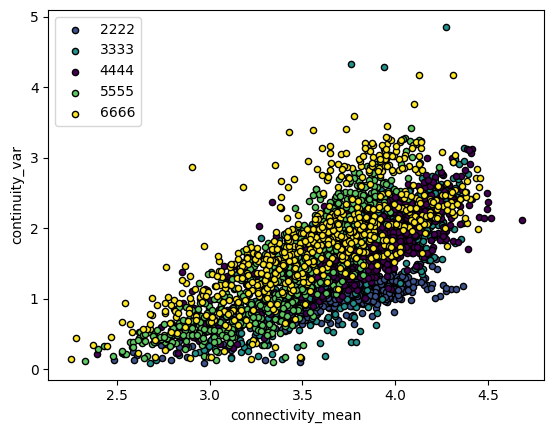

In [82]:
fig, ax = plt.subplots()
colors = {2222:'#3b528b', 3333:'#21918c', 4444:'#440154', 5555:'#5ec962', 6666:'#fde725'}

grouped = experiments_combined.groupby('seed')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='connectivity_mean', y='continuity_var', label=key, color=colors[key], edgecolor='black')

# plt.show()
plt.savefig('corr_continuity_var_and_connectivity_mean.png', bbox_inches='tight')


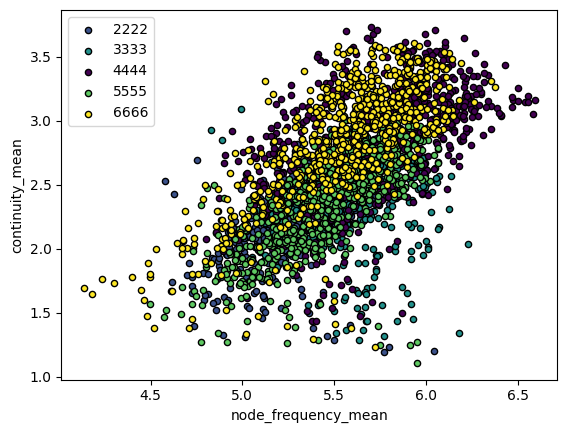

In [83]:
fig, ax = plt.subplots()
colors = {2222:'#3b528b', 3333:'#21918c', 4444:'#440154', 5555:'#5ec962', 6666:'#fde725'}

grouped = experiments_combined.groupby('seed')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='node_frequency_mean', y='continuity_mean', label=key, color=colors[key], edgecolor='black')

# plt.show()
plt.savefig('corr_node_frequency_mean_continuity_mean.png', bbox_inches='tight')


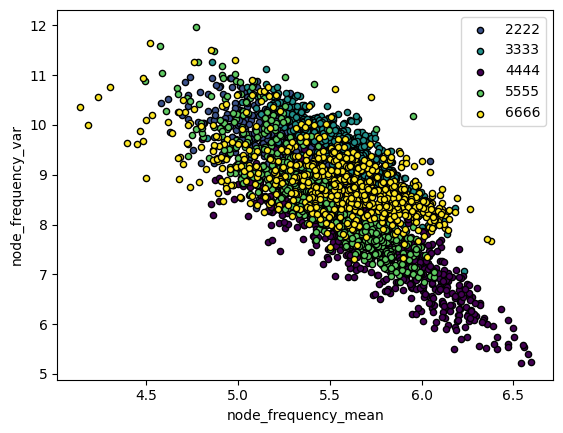

In [84]:
fig, ax = plt.subplots()
colors = {2222:'#3b528b', 3333:'#21918c', 4444:'#440154', 5555:'#5ec962', 6666:'#fde725'}

grouped = experiments_combined.groupby('seed')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='node_frequency_mean', y='node_frequency_var', label=key, color=colors[key], edgecolor='black')

# plt.show()
plt.savefig('corr_node_frequency_mean_and_var.png', bbox_inches='tight')


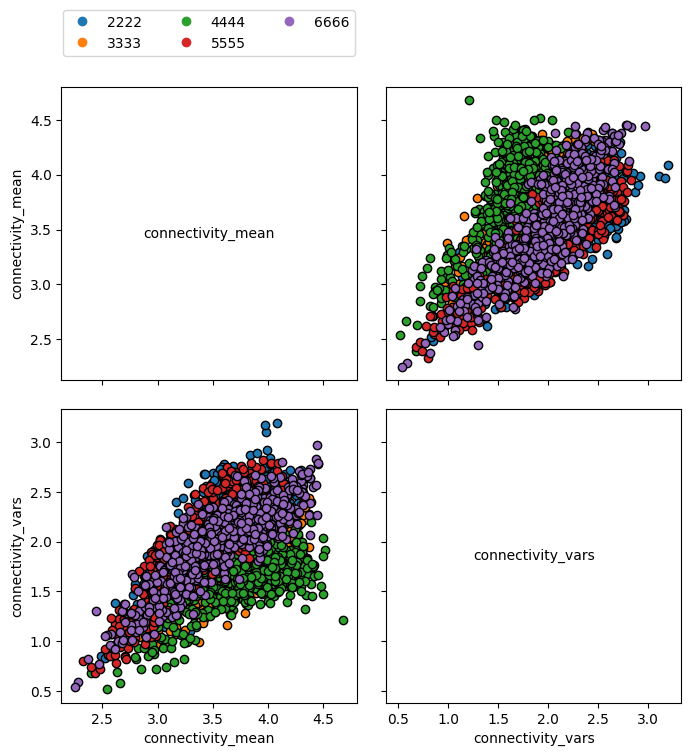

In [22]:
fig, axes = pairs_plotting.pairs_scatter(experiments_combined, dict((k, outcomes_combined[k]) for k in ('connectivity_mean', 'connectivity_mean')), group_by='seed', grouping_specifiers = {2222: 2222, 3333:3333, 4444:4444, 5555:5555, 6666:6666}, legend=True)
fig.set_size_inches(8, 8)
plt.show()

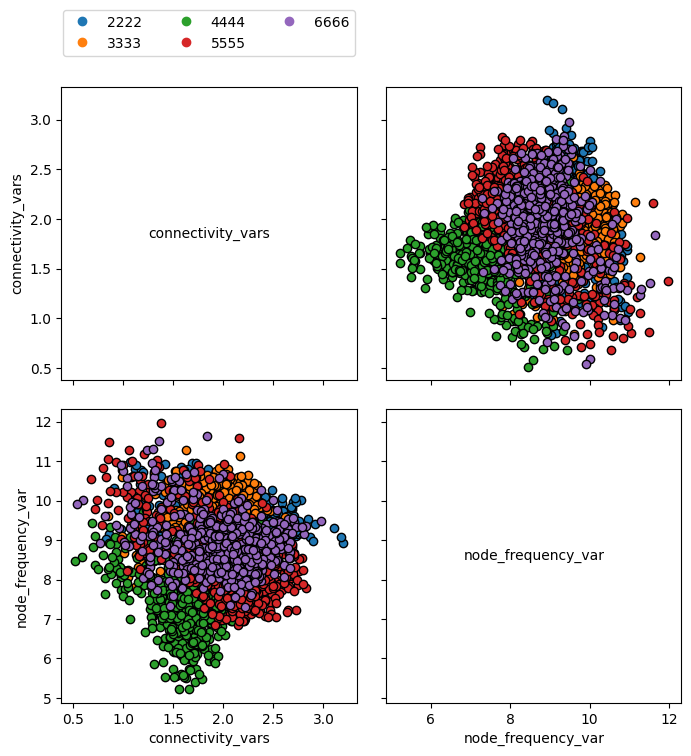

In [21]:
fig, axes = pairs_plotting.pairs_scatter(experiments_combined, dict((k, outcomes_combined[k]) for k in ('connectivity_vars', 'node_frequency_var')), group_by='seed', grouping_specifiers = {2222: 2222, 3333:3333, 4444:4444, 5555:5555, 6666:6666}, legend=True)
fig.set_size_inches(8, 8)
plt.show()

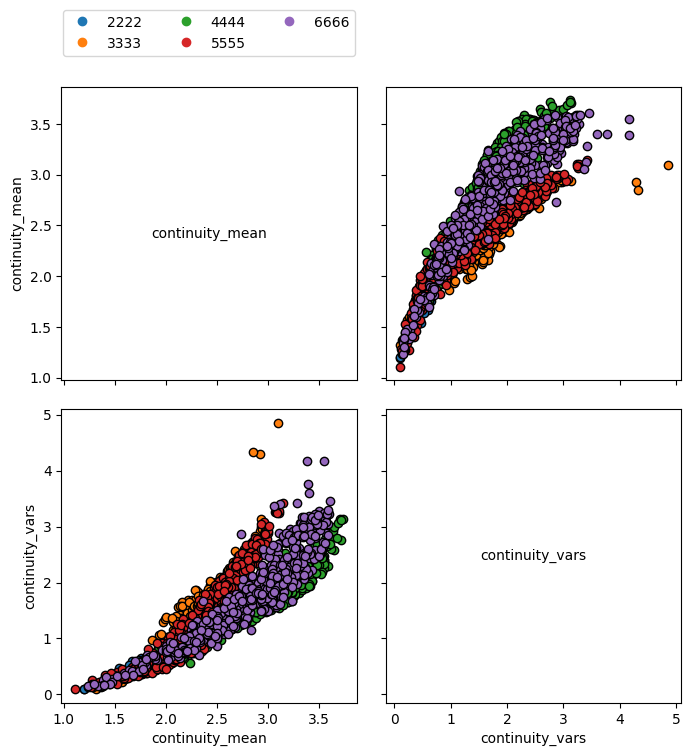

In [28]:
fig, axes = pairs_plotting.pairs_scatter(experiments_combined, dict((k, outcomes_combined[k]) for k in ('continuity_mean', 'continuity_vars')), group_by='seed', grouping_specifiers = {2222: 2222, 3333:3333, 4444:4444, 5555:5555, 6666:6666}, legend=True)
fig.set_size_inches(8, 8)
plt.show()

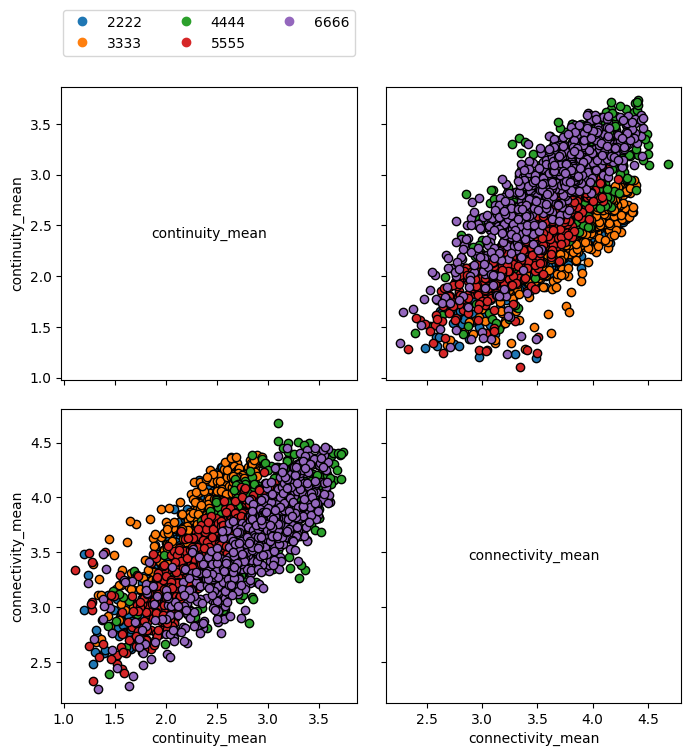

In [31]:
fig, axes = pairs_plotting.pairs_scatter(experiments_combined, dict((k, outcomes_combined[k]) for k in ('continuity_mean', 'connectivity_mean')), group_by='seed', grouping_specifiers = {2222: 2222, 3333:3333, 4444:4444, 5555:5555, 6666:6666}, legend=True)
fig.set_size_inches(8, 8)
plt.show()

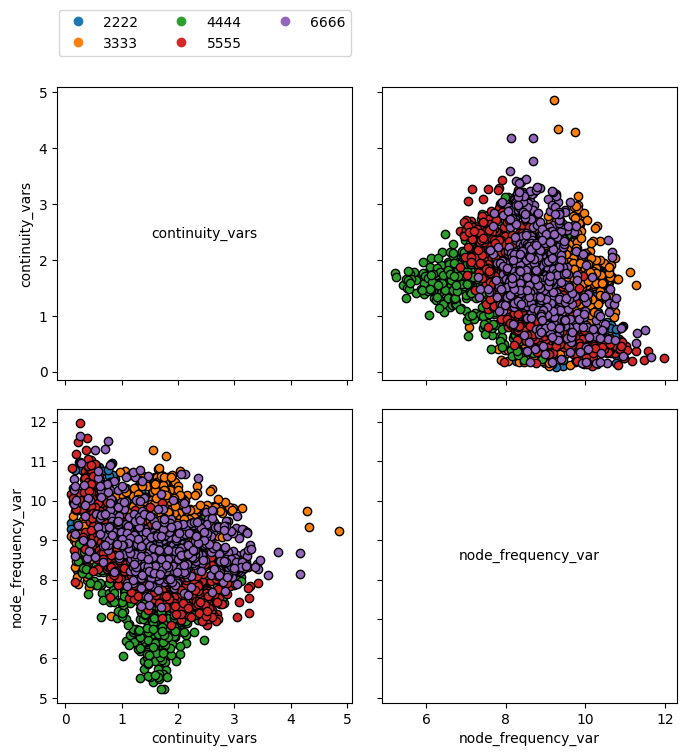

In [19]:
fig, axes = pairs_plotting.pairs_scatter(experiments_combined, dict((k, outcomes_combined[k]) for k in ('continuity_vars', 'node_frequency_var')), group_by='seed', grouping_specifiers = {2222: 2222, 3333:3333, 4444:4444, 5555:5555, 6666:6666}, legend=True)
fig.set_size_inches(8, 8)
plt.show()

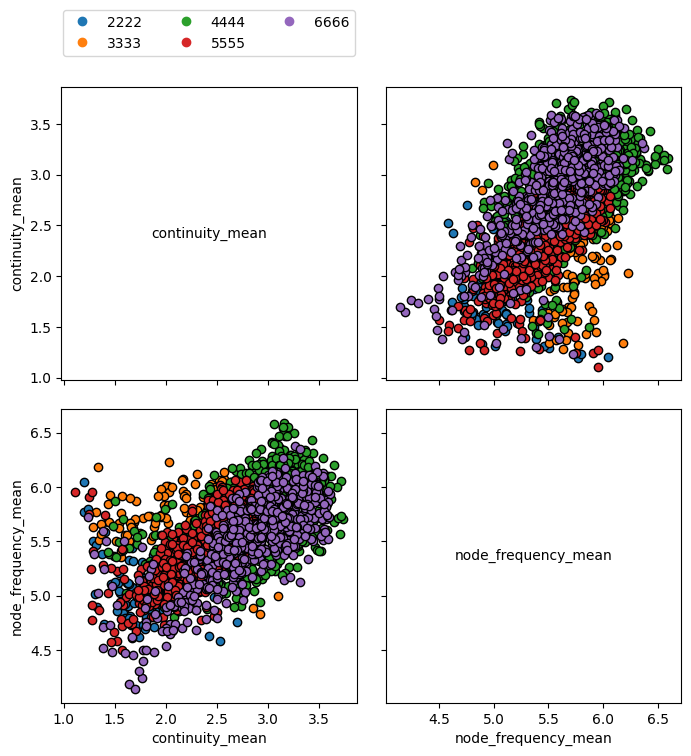

In [18]:
fig, axes = pairs_plotting.pairs_scatter(experiments_combined, dict((k, outcomes_combined[k]) for k in ('continuity_mean', 'node_frequency_mean')), group_by='seed', grouping_specifiers = {2222: 2222, 3333:3333, 4444:4444, 5555:5555, 6666:6666}, legend=True)
fig.set_size_inches(8, 8)
plt.show()

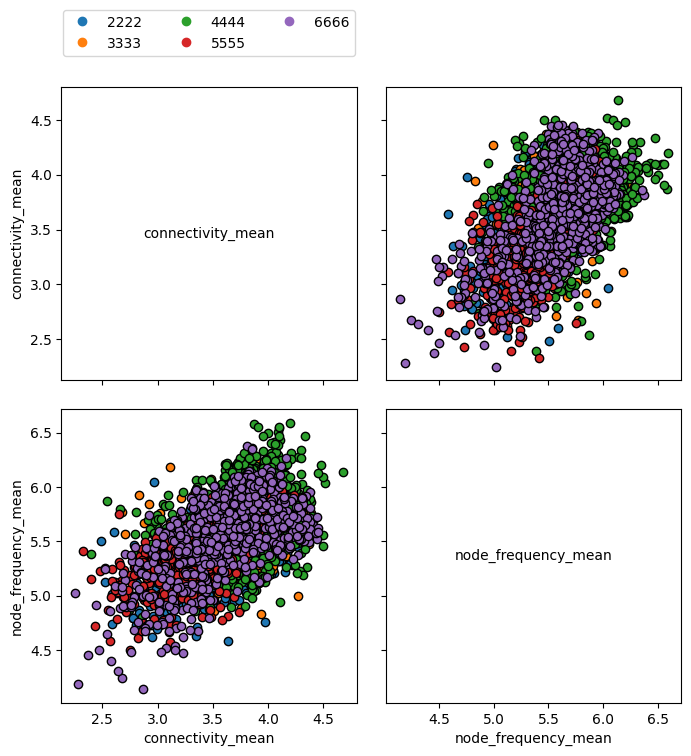

In [33]:
fig, axes = pairs_plotting.pairs_scatter(experiments_combined, dict((k, outcomes_combined[k]) for k in ('connectivity_mean', 'node_frequency_mean')), group_by='seed', grouping_specifiers = {2222: 2222, 3333:3333, 4444:4444, 5555:5555, 6666:6666}, legend=True)
fig.set_size_inches(8, 8)
plt.show()

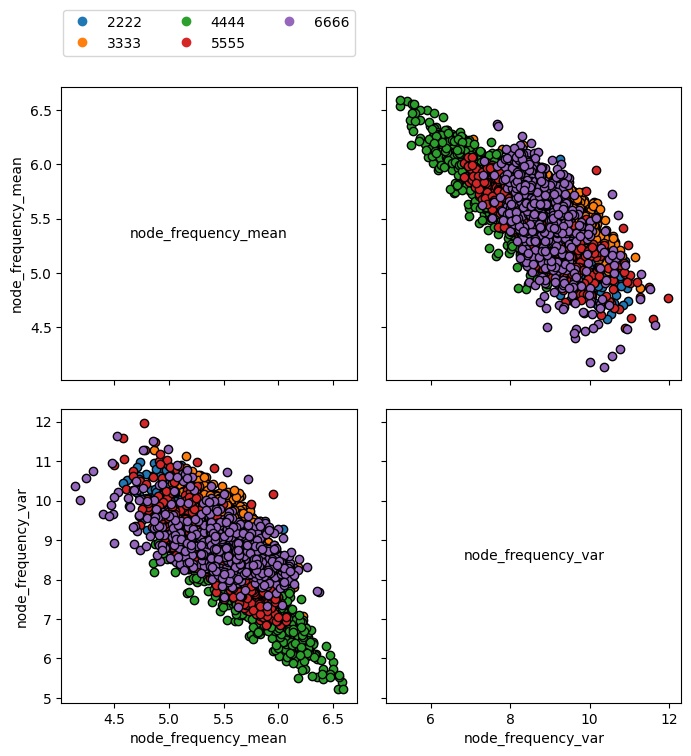

In [34]:
fig, axes = pairs_plotting.pairs_scatter(experiments_combined, dict((k, outcomes_combined[k]) for k in ('node_frequency_mean', 'node_frequency_var')), group_by='seed', grouping_specifiers = {2222: 2222, 3333:3333, 4444:4444, 5555:5555, 6666:6666}, legend=True)
fig.set_size_inches(8, 8)
plt.show()

### Statistical values

In [74]:
stats_df = pd.DataFrame()
for key in list(outcomes_combined.keys()):
    df = pd.DataFrame(outcomes_combined[key])
    stats_df[key] = df.describe()

In [75]:
stats_df

,continuity_mean,continuity_vars,connectivity_mean,connectivity_vars,node_frequency_mean,node_frequency_var
count,3500.000000,3500.000000,3500.000000,3500.000000,3500.000000,3500.000000
mean,2.566735,1.548585,3.664553,1.948057,5.523182,8.785903
std,0.455256,0.666662,0.385026,0.391608,0.329266,1.002276
min,1.109683,0.092531,2.251061,0.515794,4.136958,5.221197
25%,2.286036,1.037593,3.427887,1.702100,5.309540,8.172378
50%,2.551016,1.562834,3.729492,1.978501,5.525411,8.905250
75%,2.864514,2.004376,3.938768,2.229116,5.736665,9.485422
max,3.735265,4.859350,4.682676,3.198324,6.593909,11.973256


# Scenario analysis

## Continuity

### Case: high continuity mean

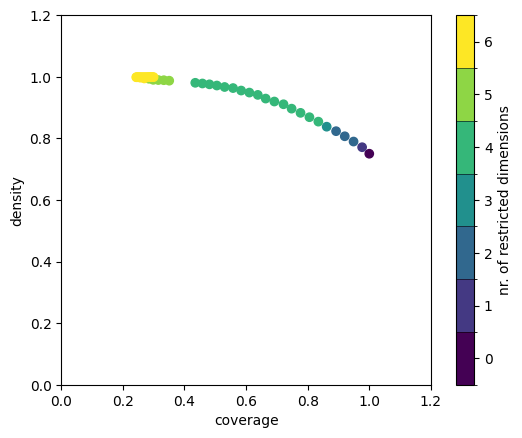

In [24]:
x = experiments_combined[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA', 'seed']]
y = outcomes_combined["continuity_mean"] > 2.286036	
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()
box1.show_tradeoff()

plt.savefig('scenario_analysis_tradeoff.png', bbox_inches='tight')

coverage    0.805714
density     0.868583
id                 7
mass        0.695714
mean        0.868583
res_dim            4
Name: 7, dtype: object

       box 7                                          
         min       max                       qp values
OA  1.587210  4.997080   [8.971397155413084e-14, -1.0]
TA  1.386771  4.994751  [1.3156602683582537e-05, -1.0]
HS  0.144679  0.999027    [0.002969166705464274, -1.0]
OW  1.193946  4.998581    [0.012318050192458067, -1.0]



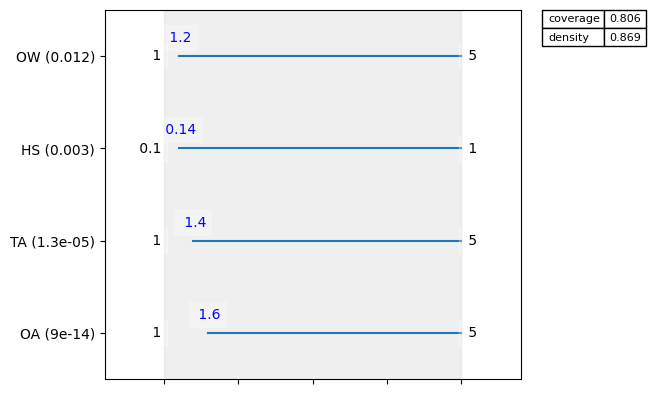

In [25]:
box_num = 7
box1.inspect(box_num)
box1.inspect(box_num, style="graph")
plt.savefig('scenario_analysis_ranges.png', bbox_inches='tight')

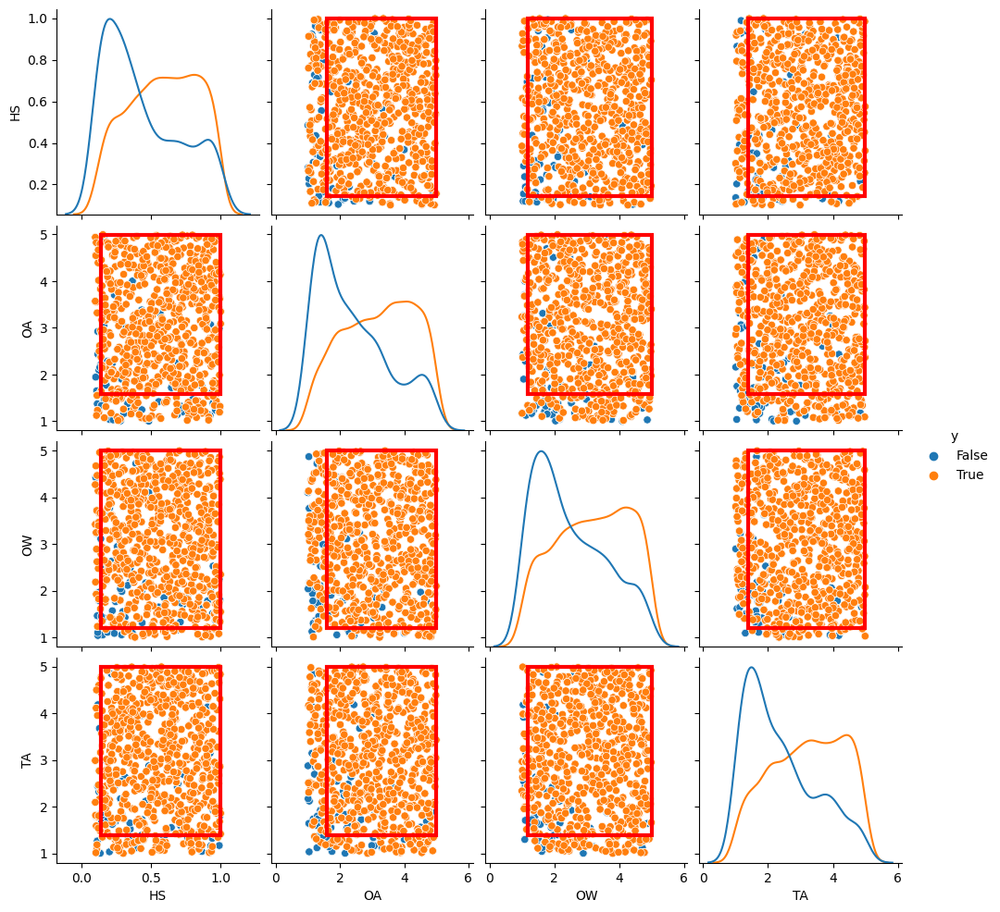

In [26]:
box1.show_pairs_scatter(box_num)
plt.savefig('scenario_analysis_distribution.png', bbox_inches='tight')

### Case: low continuity mean

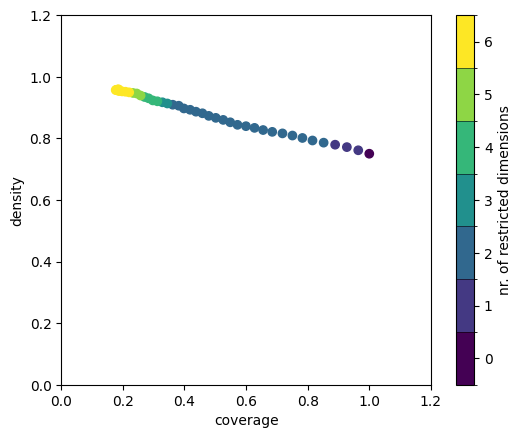

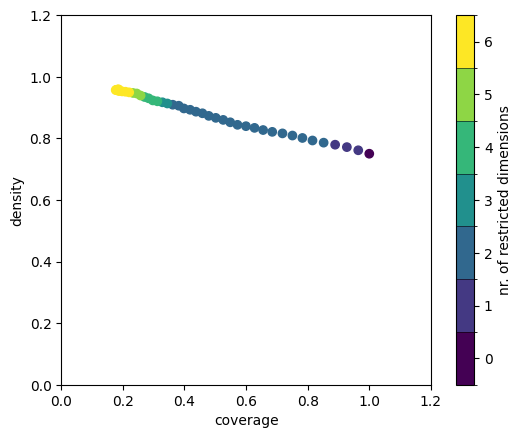

In [12]:
x = experiments_combined[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']]
y = outcomes_combined["continuity_mean"] < 2.864514	
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()
box1.show_tradeoff()

### Case: High continuity vars

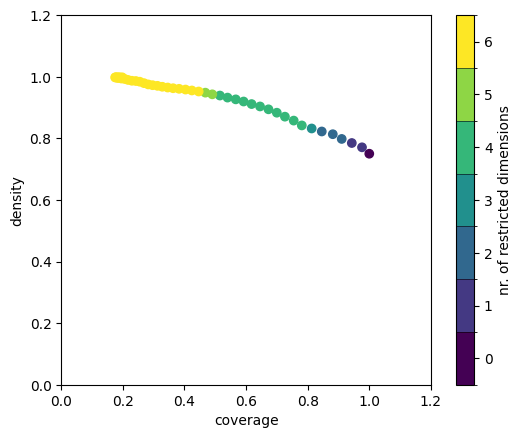

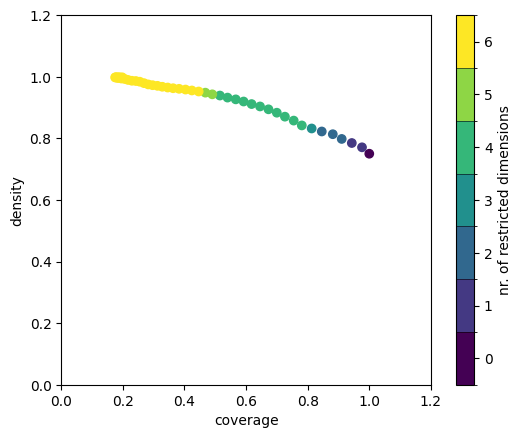

In [13]:
x = experiments_combined[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']]
y = outcomes_combined["continuity_vars"] > 1.037593		
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()
box1.show_tradeoff()

### Case: Low continuity vars

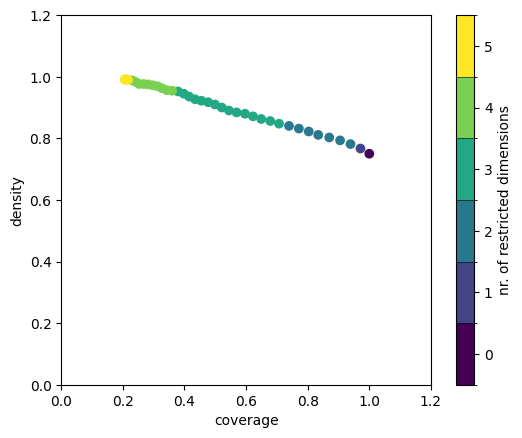

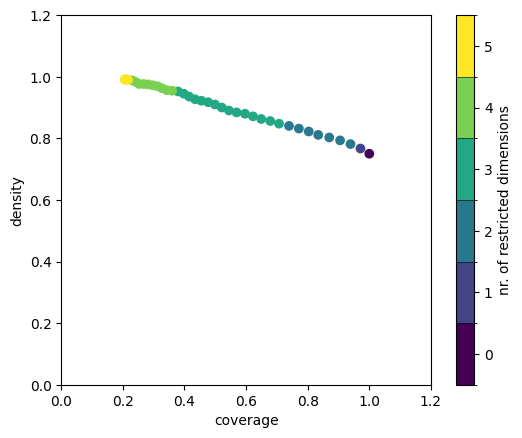

In [17]:
x = experiments_combined[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']]
y = outcomes_combined["continuity_vars"] < 2.004376	
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()
box1.show_tradeoff()

## Connectivity

### Case: high connectivity mean

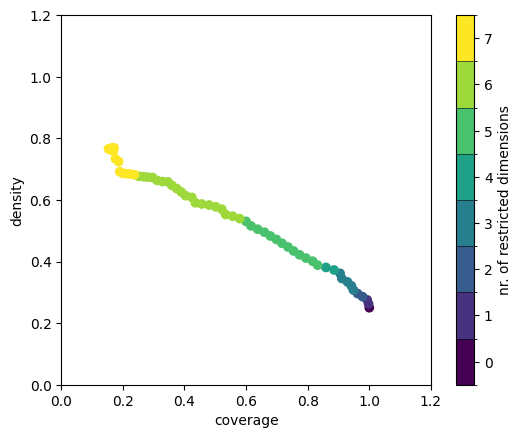

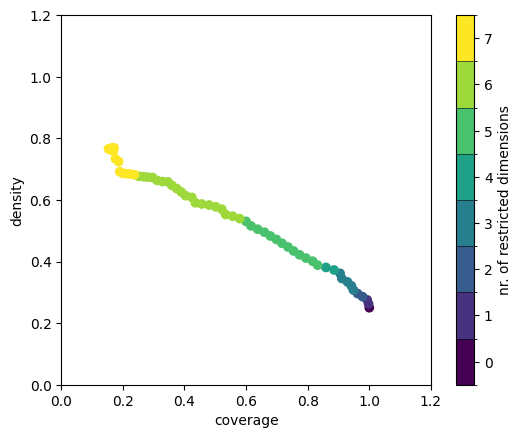

In [85]:
x = experiments_combined[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']]
y = outcomes_combined["connectivity_mean"] > 3.938768
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()
box1.show_tradeoff()

### Case: low continuity mean

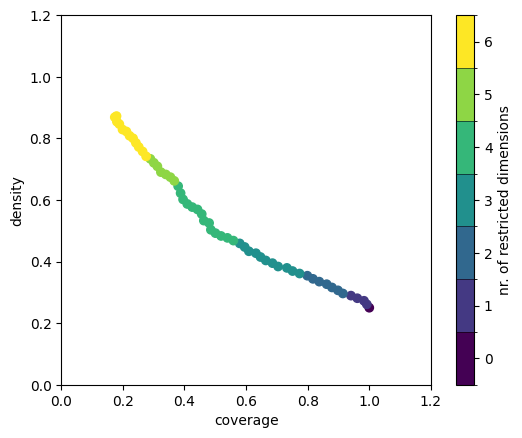

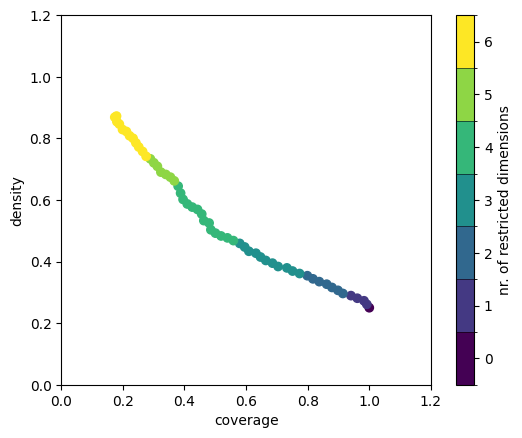

In [90]:
x = experiments_combined[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']]
y = outcomes_combined["connectivity_mean"] < 3.427887	
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()
box1.show_tradeoff()

### Case: High connectivity vars

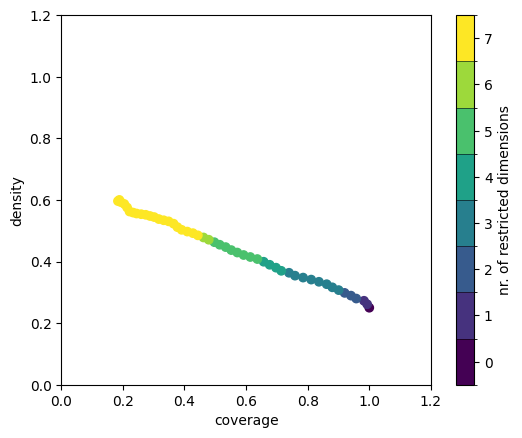

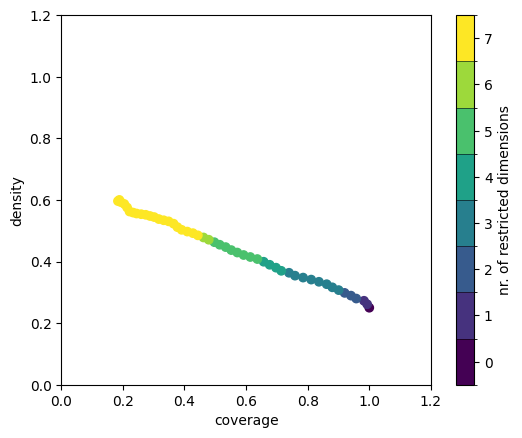

In [97]:
x = experiments_combined[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']]
y = outcomes_combined["connectivity_vars"] > 2.229116
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()
box1.show_tradeoff()

### Case: Low connectivity vars

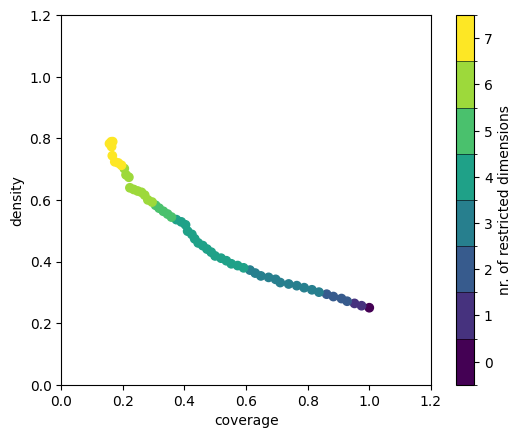

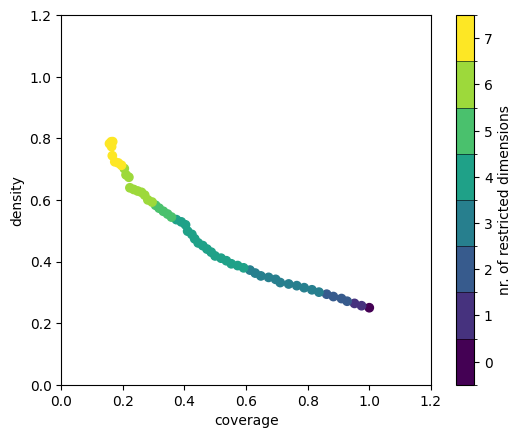

In [98]:

x = experiments_combined[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']]
y = outcomes_combined["connectivity_vars"] < 1.702100	
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()
box1.show_tradeoff()

## Node frequency

### Case: high node frequency mean

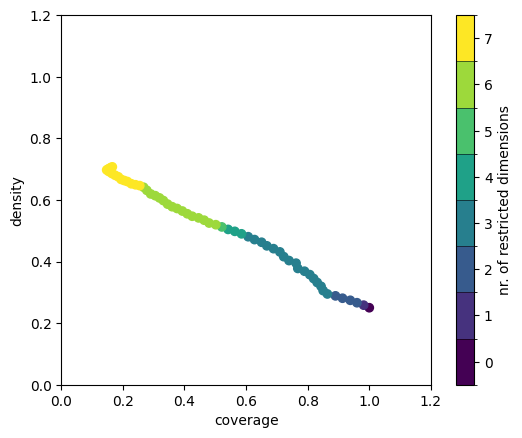

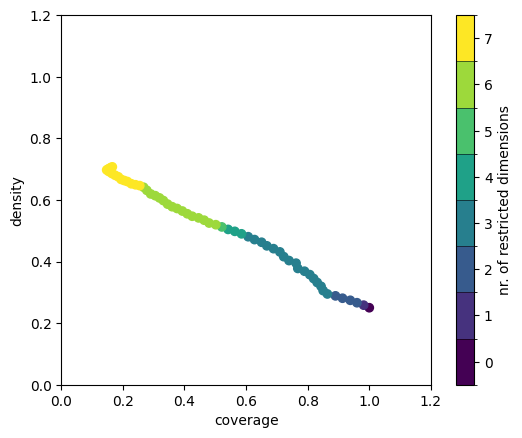

In [86]:
x = experiments_combined[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']]
y = outcomes_combined["node_frequency_mean"] > 5.736665
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()
box1.show_tradeoff()

### Case: low node frequency mean

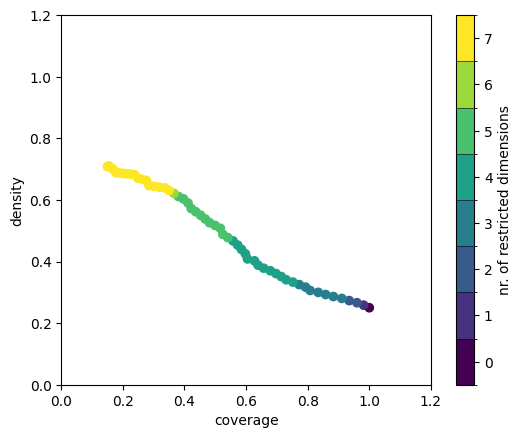

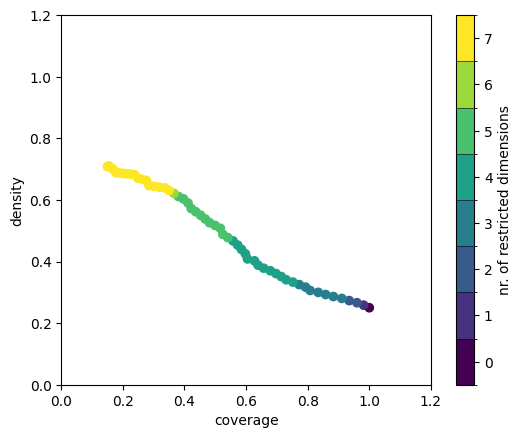

In [91]:

x = experiments_combined[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']]
y = outcomes_combined["node_frequency_mean"] < 5.309540
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()
box1.show_tradeoff()

### Case: high node frequency vars

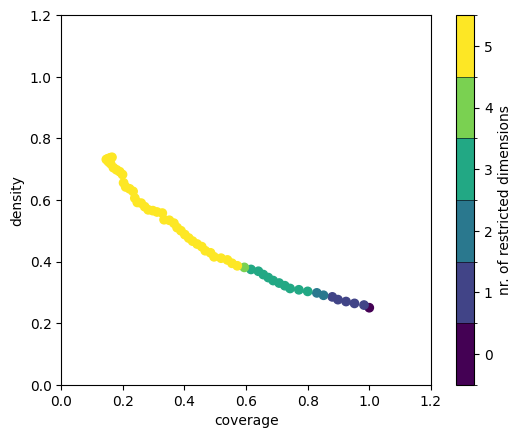

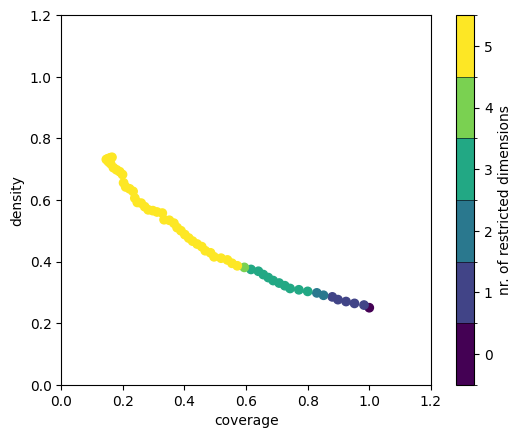

In [100]:
x = experiments_combined[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']]
y = outcomes_combined["node_frequency_var"] > 9.485422
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()
box1.show_tradeoff()

### Case: low node frequency vars

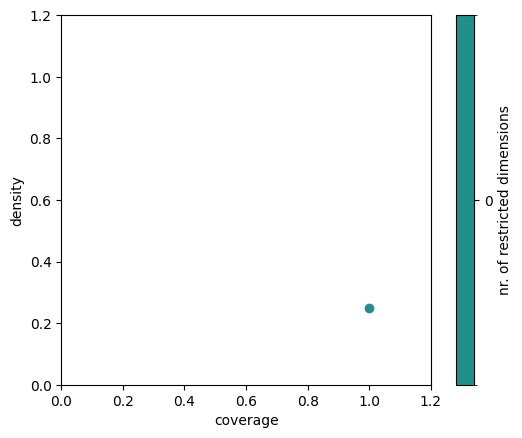

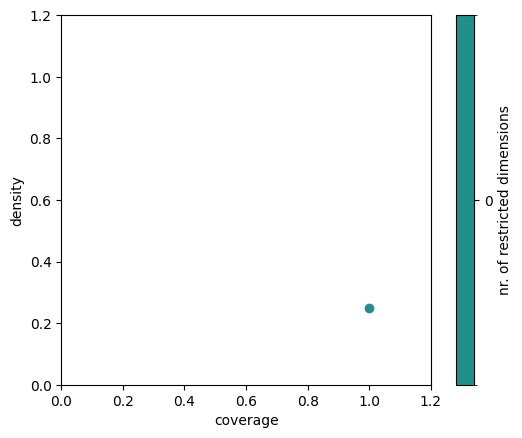

In [102]:
x = experiments_combined[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']]
y = outcomes_combined["node_frequency_var"] < 8.172378
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()
box1.show_tradeoff()

# Linear regression 

In [52]:
from sklearn.linear_model import LinearRegression

In [69]:
experiments_combined.keys()

Index(['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA', 'scenario', 'policy', 'model',
       'seed'],
      dtype='object')

In [85]:
uncertainty = "TA"

In [86]:
linear_regressor = LinearRegression()  # create object for the class
linear_regressor.fit(experiments_combined[uncertainty].to_numpy().reshape(-1, 1), outcomes_combined.get('connectivity_mean').reshape(-1, 1))  # perform linear regression
Y_pred = linear_regressor.predict(experiments_combined[uncertainty].to_numpy().reshape(-1, 1))  # make predictions

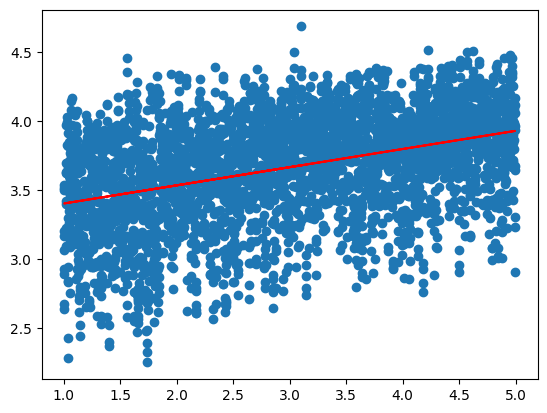

In [87]:
plt.scatter(experiments_combined[uncertainty].to_numpy().reshape(-1, 1), outcomes_combined.get('connectivity_mean').reshape(-1, 1))
plt.plot(experiments_combined[uncertainty].to_numpy().reshape(-1, 1), Y_pred, color='red')
plt.show()

# Correlation matrix

Text(0, 0.5, 'Frequency')

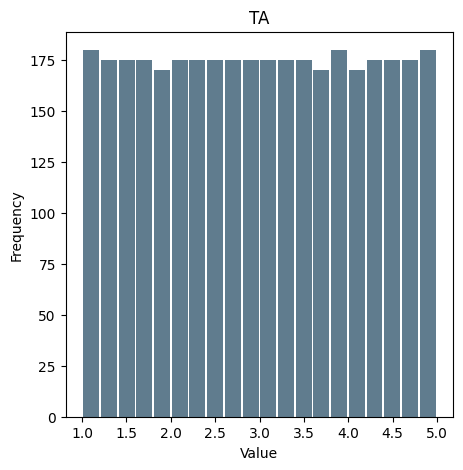

In [34]:
fig, axs = plt.subplots( figsize=(5, 5))
histogram = pd.Series(experiments_combined.get("TA"))
axs.hist(histogram, bins=20, rwidth=0.9,
                       color='#607c8e')
axs.set_title("TA")
axs.set_xlabel('Value')
axs.set_ylabel('Frequency')

In [19]:
for key in outcomes_combined.keys():
    experiments_combined[key] = outcomes_combined.get(key)

In [20]:
experiments_combined.keys()

Index(['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA', 'scenario', 'policy', 'model',
       'seed', 'continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var'],
      dtype='object')

In [24]:

correlation_mat = experiments_combined[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA','continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var']].corr(method='kendall')
corr_mat = correlation_mat[['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']].loc[['continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var']]

In [25]:
corr_mat

# sns.heatmap(correlation_mat, annot = True)
# plt.show()

,CA,HS,LP,OA,OW,RP,TA
continuity_mean,-0.007620,0.161976,0.142961,0.208981,0.192281,-0.208868,0.237199
continuity_var,0.006100,0.184054,0.119965,0.167970,0.220010,-0.199474,0.234420
connectivity_mean,0.001815,0.244197,-0.025346,0.219359,0.151566,-0.246081,0.263995
connectivity_var,0.000390,0.172868,-0.032185,0.094736,0.193021,-0.137005,0.165188
node_frequency_mean,0.004231,0.202474,0.247493,0.144325,-0.041314,-0.136882,0.147364
node_frequency_var,0.005556,-0.178745,-0.116884,0.016290,-0.000063,0.035442,-0.093015


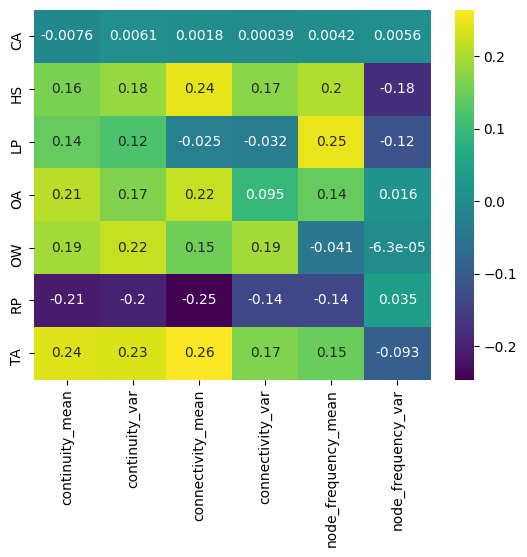

In [26]:
sns.heatmap(corr_mat.T, cmap="viridis", annot = True)
plt.savefig('BR_correlation_experiments.png', bbox_inches='tight')


In [37]:
import scipy.stats

In [42]:
scipy.stats.kendalltau(experiments_combined["TA"], experiments_combined["continuity_mean"])

KendalltauResult(correlation=0.23719927078765934, pvalue=3.7278625497844073e-98)

In [44]:
experiments_combined.keys()

Index(['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA', 'scenario', 'policy', 'model',
       'seed', 'continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var'],
      dtype='object')

In [55]:
corr_mat = pd.DataFrame(columns=['continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var'])
p_mat = pd.DataFrame()
for value1 in ['CA', 'HS', 'LP', 'OA', 'OW', 'RP', 'TA']:
    for value2 in ['continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var']:
        corr_mat.at[value1, value2] = scipy.stats.kendalltau(experiments_combined[value1], experiments_combined[value2])[0]
        p_mat.at[value1, value2] = scipy.stats.kendalltau(experiments_combined[value1], experiments_combined[value2])[1]
                                

In [56]:
corr_mat

,continuity_mean,continuity_var,connectivity_mean,connectivity_var,node_frequency_mean,node_frequency_var
CA,-0.00762,0.0061,0.001815,0.00039,0.004231,0.005556
HS,0.161976,0.184054,0.244197,0.172868,0.202474,-0.178745
LP,0.142961,0.119965,-0.025346,-0.032185,0.247493,-0.116884
OA,0.208981,0.16797,0.219359,0.094736,0.144325,0.01629
OW,0.192281,0.22001,0.151566,0.193021,-0.041314,-0.000063
RP,-0.208868,-0.199474,-0.246081,-0.137005,-0.136882,0.035442
TA,0.237199,0.23442,0.263995,0.165188,0.147364,-0.093015


In [58]:
corr_mat.to_excel('corr_mat_exp_to_outcomes.xlsx')

In [57]:
p_mat

,continuity_mean,continuity_var,connectivity_mean,connectivity_var,node_frequency_mean,node_frequency_var
CA,4.993726e-01,5.886901e-01,8.721931e-01,9.724060e-01,7.076213e-01,6.223459e-01
HS,9.420677e-47,7.633696e-60,6.466896e-104,5.276719e-53,4.925228e-72,1.519940e-56
LP,8.346823e-37,2.061027e-26,2.464841e-02,4.329805e-03,1.096222e-106,3.716957e-25
OA,1.287943e-76,3.834750e-50,3.192654e-84,4.543266e-17,1.773762e-37,1.487367e-01
OW,3.805817e-65,1.033478e-84,3.730801e-41,1.238113e-65,2.499493e-04,9.955619e-01
RP,1.551511e-76,5.706295e-70,1.703887e-105,6.097936e-34,6.966209e-34,1.679138e-03
TA,3.727863e-98,6.499537e-96,4.063674e-121,1.487182e-48,5.337478e-39,1.645362e-16


In [59]:
p_mat.to_excel('corr_mat_exp_to_outcomes_p_values.xlsx')

### Test for normality

In [27]:

from scipy.stats import shapiro 

In [33]:

print('shapiro values for CA', shapiro(experiments_combined.get("TA")))

shapiro values for CA ShapiroResult(statistic=0.9548851847648621, pvalue=1.3228786553744315e-31)


Text(0, 0.5, 'Frequency')

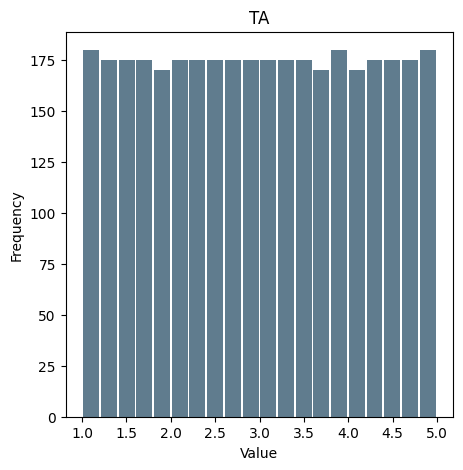

In [35]:
fig, axs = plt.subplots( figsize=(5, 5))
histogram = pd.Series(experiments_combined.get("TA"))
axs.hist(histogram, bins=20, rwidth=0.9,
                       color='#607c8e')
axs.set_title("TA")
axs.set_xlabel('Value')
axs.set_ylabel('Frequency')

In [30]:
print('shapiro values for continuity mean', shapiro(experiments_combined['continuity_mean']))
print('shapiro values for continuity_var', shapiro(experiments_combined['continuity_var']))
print('shapiro values for connectivity_mean', shapiro(experiments_combined['connectivity_mean']))
print('shapiro values for connectivity_var', shapiro(experiments_combined['connectivity_var']))
print('shapiro values for node_frequency_mean', shapiro(experiments_combined['node_frequency_mean']))
print('shapiro values for node_frequency_var', shapiro(experiments_combined['node_frequency_var']))

shapiro values for continuity mean ShapiroResult(statistic=0.9946876168251038, pvalue=5.682742054702317e-10)
shapiro values for continuity_var ShapiroResult(statistic=0.9896731376647949, pvalue=2.788450250053049e-15)
shapiro values for connectivity_mean ShapiroResult(statistic=0.9716609120368958, pvalue=8.879591528788308e-26)
shapiro values for connectivity_var ShapiroResult(statistic=0.9870651364326477, pvalue=2.284925472830536e-17)
shapiro values for node_frequency_mean ShapiroResult(statistic=0.9983959197998047, pvalue=0.0014285867800936103)
shapiro values for node_frequency_var ShapiroResult(statistic=0.9859248995780945, pvalue=3.4545825163460363e-18)


In [60]:
corr_mat = pd.DataFrame()
p_mat = pd.DataFrame()
for value1 in ['continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var']:
    for value2 in ['continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var']:
        corr_mat.at[value1, value2] = scipy.stats.kendalltau(experiments_combined[value1], experiments_combined[value2])[0]
        p_mat.at[value1, value2] = scipy.stats.kendalltau(experiments_combined[value1], experiments_combined[value2])[1]
    

In [63]:
corr_mat
corr_mat.to_excel('corr_mat_outcomes_to_outcomes.xlsx')

In [64]:
p_mat
p_mat.to_excel('corr_mat_outcomes_to_outcomes_p_values.xlsx')

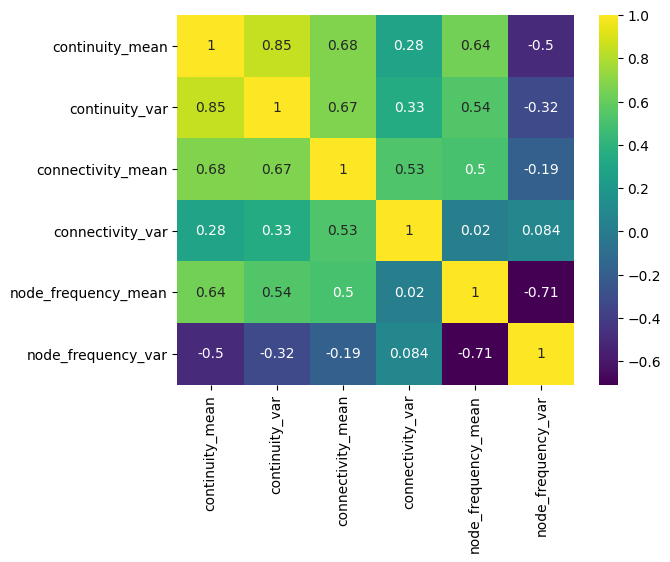

In [37]:
correlation_mat = experiments_combined[['continuity_mean', 'continuity_var', 'connectivity_mean',
       'connectivity_var', 'node_frequency_mean', 'node_frequency_var']].corr()
sns.heatmap(correlation_mat.T, cmap="viridis", annot = True)
plt.savefig('BR_correlation_outcomes.png', bbox_inches='tight')